# Complex Objects and Distributions

<h1>Complex Objects and Distributions</h1>

<p>
<b>Quantitative Big Imaging - ETHZ: 227-0966-00L</b>
<br />
</p>
<br />
<p style="font-size:1em;">April 7, 2022</p>
<br /><br />
<p style="font-size:1.5em;padding-bottom: 0.25em;">Anders Kaestner</p>  
<p style="font-size:1em;">Laboratory for Neutron Scattering and Imaging<br />Paul Scherrer Institut</p>

## Literature / Useful References

### Books
- Jean Claude, Morphometry with R [Online](http://link.springer.com/book/10.1007%2F978-0-387-77789-4) through ETHZ, or [Buy it](http://www.amazon.com/Morphometrics-R-Use-Julien-Claude/dp/038777789X)
- John C. Russ, “The Image Processing Handbook”,(Boca Raton, CRC Press), [online](http://dx.doi.org/10.1201/9780203881095)  
- J. Weickert, Visualization and Processing of Tensor Fields [Online](http://books.google.ch/books?id=ScLxPORMob4C&lpg=PA220&ots=mYIeQbaVXP&dq=&pg=PA220#v=onepage&q&f=false)

### Papers / Sites
- Voronoi Tesselations
 - Ghosh, S. (1997). Tessellation-based computational methods for the characterization and analysis of heterogeneous microstructures. Composites Science and Technology, 57(9-10), 1187–1210
 - [Wolfram Explanation](http://mathworld.wolfram.com/VoronoiDiagram.html)

- Self-Avoiding / Nearest Neighbor
 - Schwarz, H., & Exner, H. E. (1983). The characterization of the arrangement of feature centroids in planes and volumes. Journal of Microscopy, 129(2), 155–169.
 - Kubitscheck, U. et al. (1996). Single nuclear pores visualized by confocal microscopy and image processing. Biophysical Journal, 70(5), 2067–77.

- Alignment / Distribution Tensor
 - Mader, K. et al (2013). A quantitative framework for the 3D characterization of the osteocyte lacunar system. Bone, 57(1), 142–154
 - Aubouy, M., et al. (2003). A texture tensor to quantify deformations. Granular Matter, 5, 67–70. Retrieved from http://arxiv.org/abs/cond-mat/0301018
- Two point correlation
 - Dinis, L., et. al. (2007). Analysis of 3D solids using the natural neighbour radial point interpolation method. Computer Methods in Applied Mechanics and Engineering, 196(13-16)
 

In [67]:
import seaborn as sns
from skimage.morphology import skeletonize
from skimage.morphology import skeletonize_3d
from skimage.morphology import binary_opening, binary_closing, disk
import skimage.morphology.greyreconstruct as gr
from scipy.ndimage      import distance_transform_edt
import numpy as np
from skimage.color      import hsv2rgb, rgb2hsv
from skimage.morphology import medial_axis
from skimage.morphology import skeletonize, skeletonize_3d
from skimage.filters    import laplace
from skimage.segmentation import mark_boundaries
import seaborn as sns
from skimage.morphology import label
from scipy.ndimage import convolve

from skimage.morphology import opening, closing, disk  # for removing small objects
import matplotlib.pyplot as plt  # for showing plots
from skimage.io   import imread    # for reading images
import pandas as pd              # for reading the swc files (tables of somesort)

%matplotlib inline

from matplotlib.colors import ListedColormap
plt.rcParams["figure.figsize"] = (8, 8)
plt.rcParams["figure.dpi"] = 150
plt.rcParams["font.size"] = 14
plt.rcParams['font.family'] = ['sans-serif']
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']
plt.style.use('ggplot')
sns.set_style("whitegrid", {'axes.grid': False})

## Previously on QBI ...

<br/>
<center>
<img src="figures/07-all_icons-advancedshapes.svg" style="height:200px">
</center>

- Image Enhancement 
- Understanding image histograms
- Automatic Methods
- Component Labeling
- Single Shape Analysis
- Complicated Shapes (Thickness Maps)

## Outline

- Motivation (Why and How?)
- Skeletons
 - Tortuosity
- Watershed Segmentation
 - Connected Objects

<table>
<tr><th>

        
### Local Environment
</th>
<th>
        
### Global Enviroment
         
</th></tr>
<tr>
<td>
   
- Neighbors
- Voronoi Tesselation
- Distribution Tensor
    
</td>
<td>
    
- Alignment
- Self-Avoidance
- Two Point Correlation Function
    
</td>
</tr>
</table>







## Metrics

We examined a number of different metrics in this lecture and additionally to classifying them as __Local__ and __Global__ we can define them as point and voxel-based operations. 

### Point Operations
- Nearest Neighbor
- Point (Center of Volume)-based Voronoi Tesselation
- Alignment

### Voxel Operation
- Voronoi Tesselation
- Neighbor Counting
- 2-point (N-point) correlation function

## Learning Objectives

### Motivation (Why and How?)

- How can we extract topology of a structure?
- How do we identify seperate objects when they are connected?
- How can we compare shape of complex objects when they grow?

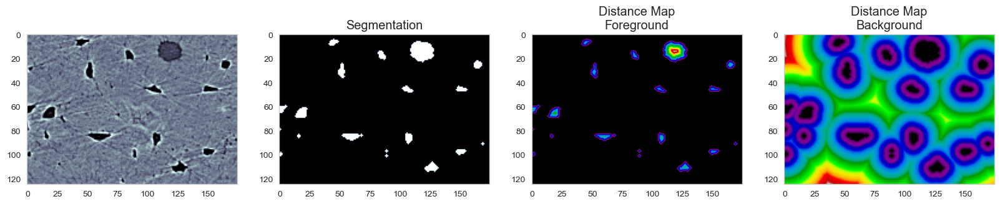

In [2]:
bw_img = imread("../Lecture-05/figures/bonegfiltslice.png")[::2, ::2]
thresh_img = binary_closing(binary_opening(bw_img < 90, disk(1)), disk(2))
fg_dmap = distance_transform_edt(thresh_img)
bg_dmap = distance_transform_edt(1-thresh_img)
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 6), dpi=100)
ax1.imshow(bw_img, cmap='bone')
ax2.imshow(thresh_img, cmap='bone');        ax2.set_title('Segmentation');
ax3.imshow(fg_dmap, cmap='nipy_spectral');  ax3.set_title('Distance Map\nForeground')
ax4.imshow(bg_dmap, cmap='nipy_spectral');  ax4.set_title('Distance Map\nBackground');

### Distribution Objectives - finding the right questions
#### We want to know how many cells are alive
 - Maybe small cells are dead and larger cells are alive $\rightarrow$ examine the volume distribution
 - Maybe living cells are round and dead cells are really spiky and pointy $\rightarrow$ examine anisotropy


#### We want to know where the cells are alive or most densely packed
 - We can visually inspect the sample (maybe even color by volume)
 - We can examine the raw positions (x,y,z) but what does that really tell us?
 - We can make boxes and count the cells inside each one
 - How do we compare two regions in the same sample or even two samples?

## So what do we still need

1. A way for counting cells in a region and estimating density without creating arbitrary boxes
1. A way for finding out how many cells are _near_ a given cell, it's nearest neighbors
1. A way for quantifying how far apart cells are and then comparing different regions within a sample
1. A way for quantifying and comparing orientations

### What would be really great? 

A tool which could be adapted to answering a large variety of problems
- multiple types of structures
- multiple phases

## Destructive Measurements

With most imaging techniques and sample types, the task of measurement itself impacts the sample.
- X-ray tomography which _claim_ to be non-destructive still impart significant to lethal doses of X-ray radition for high resolution imaging
- Electron microscopy, auto-tome-based methods, histology are all markedly more destructive and make longitudinal studies impossible

Even when such measurements are possible registration can be a difficult task and introduce artifacts



### Why is this important?

- techniques which allow us to compare different samples of the same type.
- are sensitive to common transformations
 - Sample B after the treatment looks like Sample A stretched to be 2x larger
 - The volume fraction at the center is higher than the edges but organization remains the same

# Structure analysis

One main objective in scientific imaging is to describe and quantify shapes.

We have alread looked into several metrics to describe items in the image:
- Area
- Perimeter
- Orientation
- Position 
- etc.

Today, we will look into two further techniques used for structure analysis:
- Skeletons 
- Advanced object labeling

# Skeletonization / Networks
Thin structures and networks often appears in images.

##  Thin structures to analyze
<table>
<tr><th>
<b>Roads</b>
</th>
<th>
<b>Rivers</b>
</th>
<th>
<b>Roots</b>
</th>
<th>
<b>Blood vessels</b>
</th>  
</tr>
<tr>
<td>
   <img src="figures/map_roads.png" style="height:250px"> 
</td>
<td>
   <img src="figures/riverdelta.png" style="height:250px"> 
</td>
<td>
   <img src="figures/roots_picture.jpg" style="height:250px"> 
</td>
<td>
   <img src="figures/Cerebral_Angiogram_Lateral.jpg" style="height:250px"> 
</td>
</tr>
</table>

## What we want to know about networks

I many cases we want to describe the topology of the network
- which structures are connected
- how they are connected
    - Are there loops
- express the network in a simple manner
 - quantify tortuosity
 - branching
 
We start with a simpler example from the EPFL Dataset: EPFL CVLab's Library of Tree-Reconstruction Examples (http://cvlab.epfl.ch/data/delin)

## For this we need  
The minimal structure that spans the structure topology - i.e. a skeleton

<img src="figures/sphx_glr_plot_skeleton_001.png" style="height:400px"/>

# Network analysis explained in real images

We will use an aerial picture of a street as test image for exploring how to build skeleton and to improve the performance of the skeletonization. We also have markup data as ground truth for the position of the street.

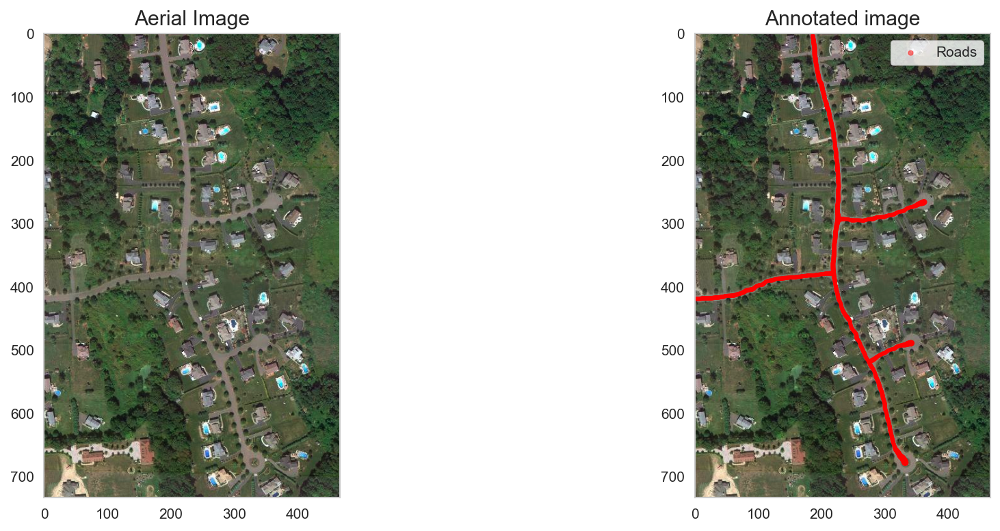

In [3]:
def read_swc(in_path):
    swc_df = pd.read_csv(in_path, sep=' ', comment='#', header=None)
    # a pure guess here
    swc_df.columns = ['id', 'junk1', 'x', 'y', 'junk2', 'width', 'next_idx']
    return swc_df[['x', 'y', 'width']]

im_data = imread('figures/ny_7.tif')
mk_data = read_swc('figures/ny_7.swc')

fig, (ax1, ax3) = plt.subplots(1, 2, figsize=(15, 6))
ax1.imshow(im_data);ax1.set_title('Aerial Image')
ax3.imshow(im_data, cmap='bone') ;ax3.scatter(mk_data['x'], mk_data['y'], s=mk_data['width'], alpha=0.5,color='red',label="Roads") ;ax3.set_title('Annotated image'), ax3.legend();

## A close-up of the street

The full street image is too large to see all details. Therefore, we crop a piece in middle of the picture.

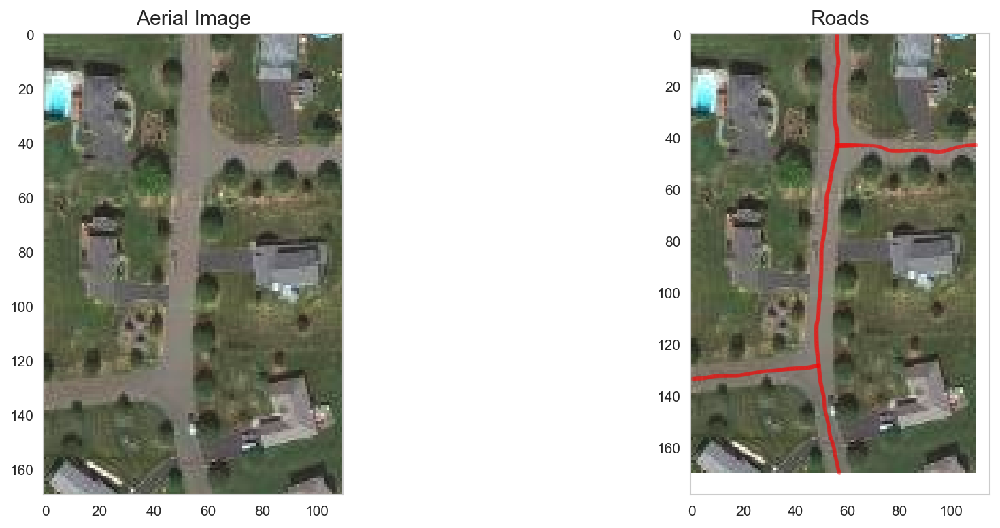

In [4]:
im_crop = im_data[250:420:1, 170:280:1]
mk_crop = mk_data.query('y>250').query(
    'y<420').query('x>170').query('x<280').copy()
mk_crop.x = (mk_crop.x-170)/1
mk_crop.y = (mk_crop.y-250)/1
fig, (ax1, ax3) = plt.subplots(1, 2, figsize=(15, 6))
ax1.imshow(im_crop)
ax1.set_title('Aerial Image')
ax3.imshow(im_crop, cmap='bone')
ax3.scatter(mk_crop['x'], mk_crop['y'], s=mk_crop['width'],color='red', alpha=0.25)
ax3.set_title('Roads');

## Let's try finding the roads

The first thing we have to for our street analysis example is to identify the street among all other features in the picture.

### Step 1: Segmentation

The picture is a color image that uses the RGB color model. In this case we will convert the color model to HSV and use the V parameter for the thresholding. An empirical value for the threshold is v>0.4. This threshold results in many structure besides the street.  

In [5]:
def thresh_image(in_img):
    v_img = rgb2hsv(in_img)[:, :, 2]
    th_img = v_img > 0.4
    op_img = opening(th_img, disk(1))
    return op_img

seg_img = thresh_image(im_crop)

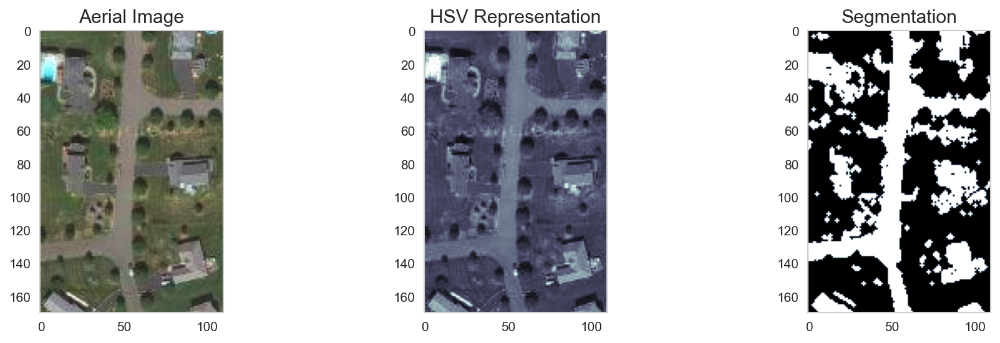

In [6]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
ax1.imshow(im_crop); ax1.set_title('Aerial Image')
ax2.imshow(rgb2hsv(im_crop)[:, :, 2], cmap='bone')
ax2.set_title('HSV Representation')
ax3.imshow(seg_img, cmap='bone')
ax3.set_title('Segmentation');

#### Other ways to do the segmentation...

Here we used a color space transformation

We could also use:
- Unsupervised segmentation like k-means
- Supervised segmentation like k-Nearest Neighbors (requires training)

### Step 2: Identify structures

Using connected component labeling

In [7]:
lab_img = label(seg_img)

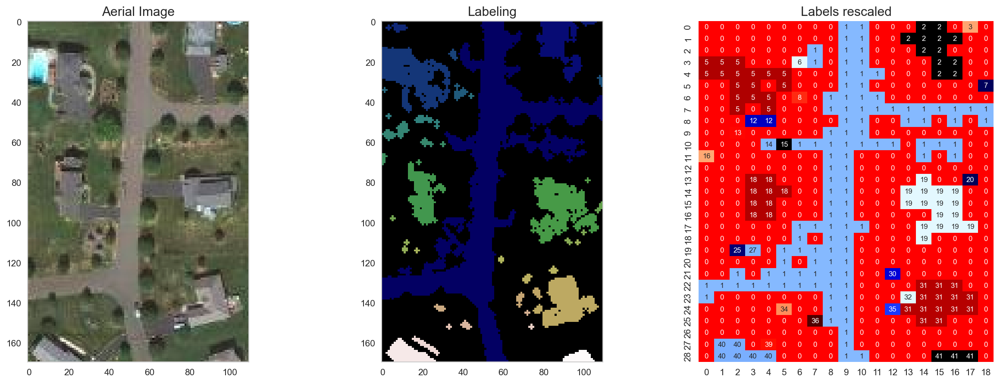

In [8]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 7))
ax1.imshow(im_crop)
ax1.set_title('Aerial Image')
ax2.imshow(lab_img, cmap='gist_earth')
ax2.set_title('Labeling')
sns.heatmap(lab_img[::6, ::6], # Show every 6th pixel
            annot=True,
            fmt="d",
            cmap='flag',
            ax=ax3,
            cbar=False,
            vmin=0,
            vmax=lab_img.max(),
            annot_kws={"size": 8})
ax3.set_title('Labels rescaled');

# Skeletonization - take one

The first step is to take the distance transform the structure 

$$I_d(x,y) = \textrm{dist}(I(x,y))$$

We can see in this image there are already local maxima that form a sort of backbone which closely maps to what we are interested in.


In [9]:
from scipy import ndimage
keep_lab_img = lab_img == 1 # Create an image with pixels belonging to i
dist_map = ndimage.distance_transform_edt(keep_lab_img)

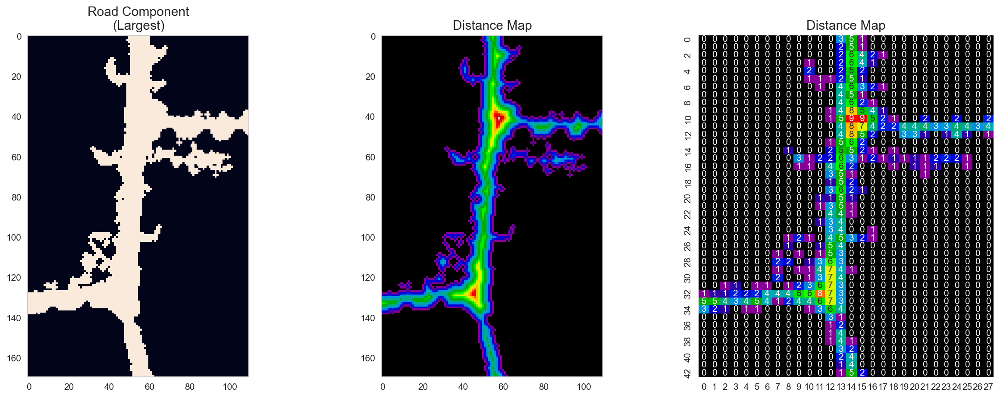

In [10]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 7))
ax1.imshow(keep_lab_img,interpolation='none')
ax1.set_title('Road Component\n(Largest)')

ax2.imshow(dist_map, cmap='nipy_spectral')
ax2.set_title('Distance Map')

sns.heatmap(dist_map[::4, ::4],     # every 4th pixel
            annot=True,
            fmt="1.0f",cmap='nipy_spectral',
            ax=ax3,cbar=False,
            vmin=0,vmax=dist_map.max(),
            annot_kws={"size": 10})
ax3.set_title('Distance Map');

## Skeletonization: Ridges

By using the Laplacian filter as an approximate for the derivative operator which finds the values which high local gradients.

$$ \nabla I_{d}(x,y) = (\frac{\delta^2}{\delta x^2}+\frac{\delta^2}{\delta y^2})I_d \approx \underbrace{\begin{bmatrix}
-1 & -1 & -1 \\
-1 & 8 & -1 \\
-1 & -1 & -1
\end{bmatrix}}_{\textrm{Laplacian Kernel}} \otimes I_d(x,y) $$

## Creating the skeleton


We can locate the local maxima of the structure by setting a minimum surface distance

$$I_d(x,y)>MIN_{DIST}$$

and combining it with a minimum slope value 

$$\nabla I_d(x,y) > MIN_{SLOPE}$$

***

### Thresholds on the distance map
Harking back to our earlier lectures, this can be seen as a threshold on a feature vector representation of the entire dataset.
- We first make the dataset into a tuple

$$ \textrm{cImg}(x,y) = \langle \underbrace{I_d(x,y)}_1, \underbrace{\nabla I_d(x,y)}_2 \rangle $$

$$ \textrm{skelImage}(x,y) =  \begin{cases}
1, & \textrm{cImg}_1(x,y)\geq MIN_{DIST}  \textrm{ and } \textrm{ cImg}_2(x,y)\geq MIN_{SLOPE} \\
0, & \textrm{otherwise}
\end{cases}$$ 

### Resulting ridge skeleton

In [11]:
lapskel = laplace(dist_map)
skel    = medial_axis(keep_lab_img, return_distance=False) ; # we use medial axis since it is cleaner

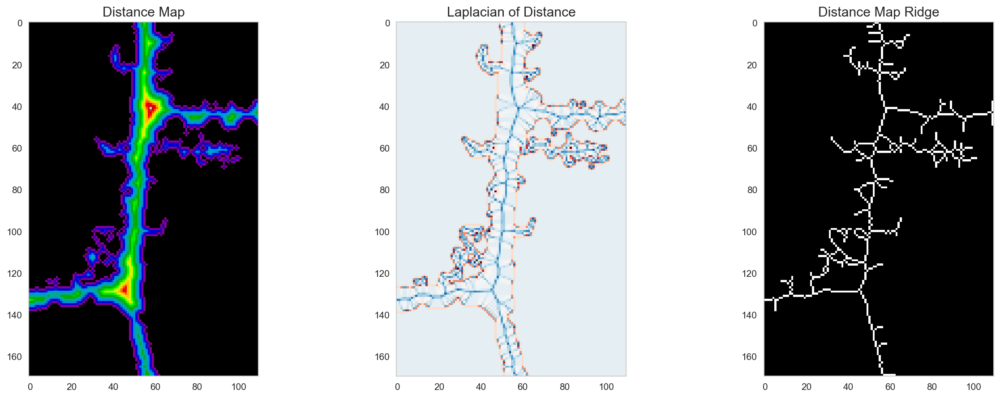

In [12]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 7))

ax1.imshow(dist_map, cmap='nipy_spectral'); ax1.set_title('Distance Map')
ax2.imshow(lapskel, cmap='RdBu'); ax2.set_title('Laplacian of Distance')


ax3.imshow(skel, cmap='gray'); ax3.set_title('Distance Map Ridge');

# Skeletonization with Morphological thinning
From scikit-image documentation (http://scikit-image.org/docs/dev/auto_examples/edges/plot_skeleton.html)

Morphological thinning, implemented in the ```thin``` function, works on the same principle as ```skeletonize```: 
- remove pixels from the borders at each iteration until none can be removed without altering the connectivity. 
- The different rules of removal can speed up skeletonization and result in different final skeletons.

The ```thin``` function also takes an optional ```max_iter``` keyword argument to limit the number of thinning iterations, and thus produce a relatively thicker skeleton.
 

We can use this to thin the tiny junk elements first then erode, then perform the full skeletonization

## Try morphological thinning

In [13]:
from skimage.morphology import thin, erosion
thin_image = thin(keep_lab_img, max_iter=1)
er_thin_image = opening(thin_image, disk(1))
er_thin_image = label(er_thin_image) == 1
opened_skeleton = medial_axis(er_thin_image, return_distance=False)

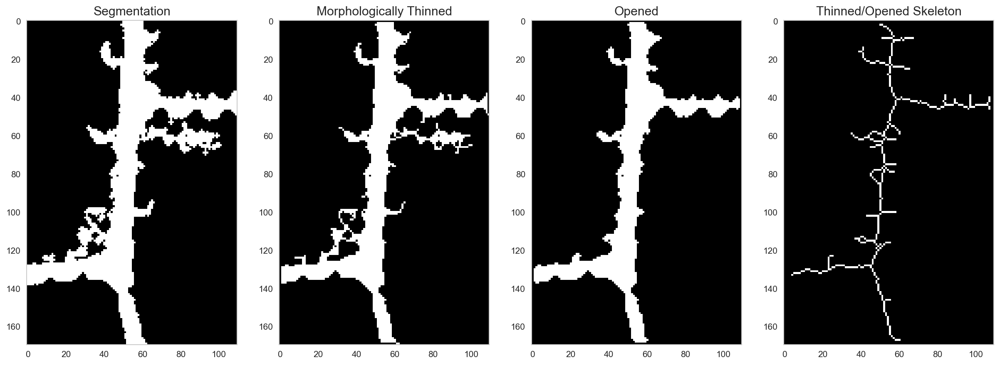

In [14]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 7))
ax1.imshow(keep_lab_img, cmap="gray"); ax1.set_title('Segmentation')
ax2.imshow(thin_image, cmap="gray"); ax2.set_title('Morphologically Thinned')
ax3.imshow(er_thin_image, cmap="gray"); ax3.set_title('Opened')
ax4.imshow(opened_skeleton, cmap="gray"); ax4.set_title('Thinned/Opened Skeleton');

### Still overgrown

The skeleton is still problematic for us and so we require some additional improvements to get a perfect skeleton.

There are a lot spurious branches and even loops on the thinned skeleton. These need to be pruned to get a skeleton that correspond to our expectations.

# Skeleton: Junction Overview 


With the skeleton which is ideally one voxel thick, we can characterize the junctions in the system by looking at the neighborhood of each voxel.


Junctions are the pixels were more than two branches intersect. In 2D, there can be at most four branches meeting up at a single pixel. There can however be clusters of junctions that correspond to more complex junction topology.

Here, we will use the convolution with a 3x3 box kernel to identify the junctions. It essentially sums all pixels in the neighborhood. The convolution widens the skeleton by one pixel in all directions. This wider skeleton can be masked with the original skeleton.

In [15]:
neighbor_conv = convolve(opened_skeleton.astype(int), np.ones((3, 3)))
neighbor_conv[~opened_skeleton] = 0

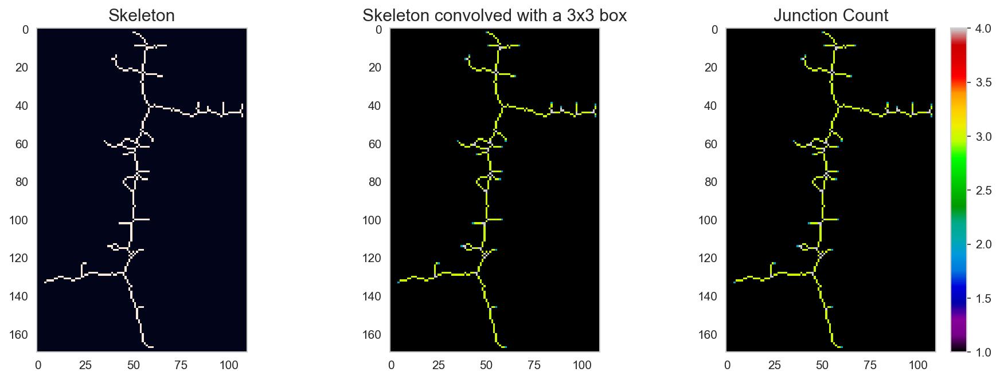

In [16]:
fig, ( ax1, ax3,ax2) = plt.subplots(1, 3, figsize=(15, 5))
ax1.imshow(opened_skeleton)
ax1.set_title('Skeleton')
ax3.imshow(neighbor_conv, cmap='nipy_spectral', vmin=1, vmax=4, interpolation='none' )
ax3.set_title('Skeleton convolved with a 3x3 box')
j_img = ax2.imshow(neighbor_conv, cmap='nipy_spectral', vmin=1, vmax=4, interpolation='none')
plt.colorbar(j_img)
ax2.set_title('Junction Count');

### Close-up on the skeleton

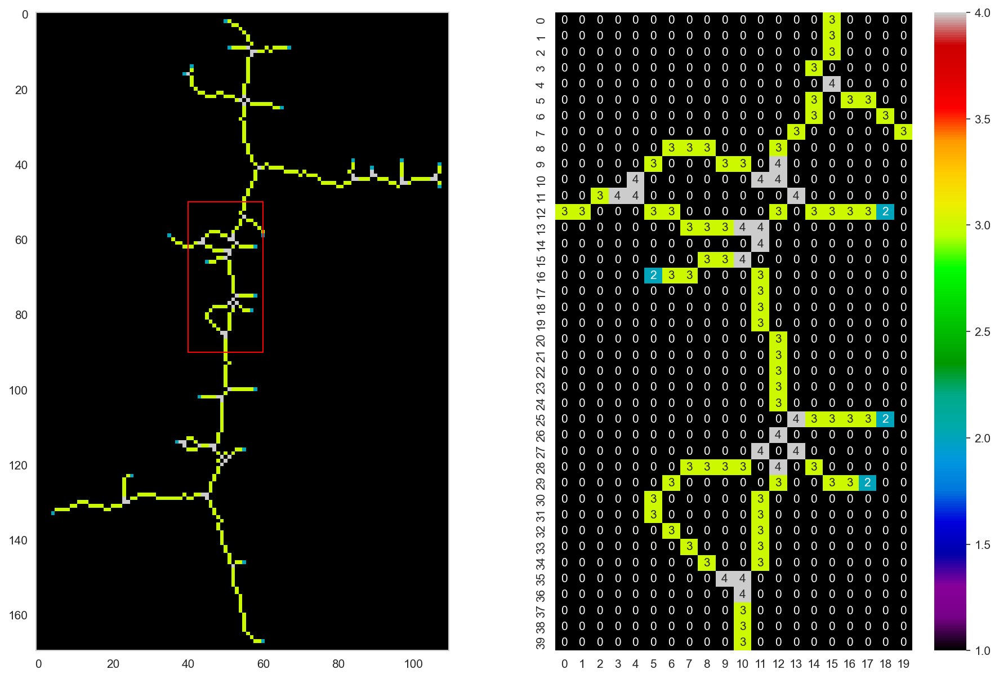

In [17]:
from matplotlib.patches import Rectangle
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(neighbor_conv,cmap='nipy_spectral', vmin=1, vmax=4, interpolation='none' );
rect = Rectangle(xy=(40.0, 50.0), height=40, width=20, linewidth=1, edgecolor='r', facecolor='none')
ax[0].add_patch(rect)
n_crop = neighbor_conv[50:90, 40:60]
sns.heatmap(n_crop, annot=True, fmt="d",cmap='nipy_spectral',
            ax=ax[1], cbar=True,
            vmin=1, vmax=n_crop.max(), annot_kws={"size": 10});

### Skeleton pixel neighborhood classes

Now that we have seen that the convolution gives information about the neigborhood constellation, we can start to look for different characteristic combinations.

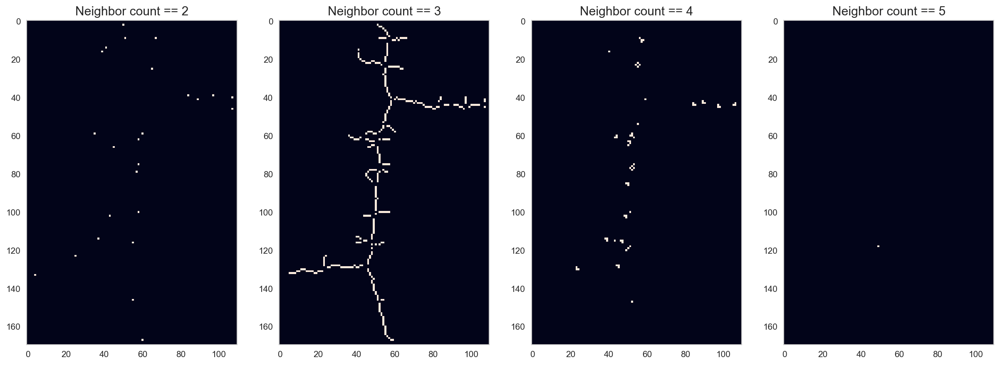

In [18]:
junc_types = np.unique(neighbor_conv[neighbor_conv > 0])
fig, m_axs = plt.subplots(1, len(junc_types), figsize=(20, 7))
for i, c_ax in zip(junc_types, m_axs):
    c_ax.imshow(neighbor_conv == i, interpolation='none')
    c_ax.set_title('Neighbor count == {}'.format(i))

In the table below we make a rough categorization of the neighbor counts.

|Pixel counts | Interpretation |
|---|:---|
|2| End point |
|3| Line segment |
|4| Three-way Junction |
|5| Four-way junction |

## Smarter kernel coding

The uniform kernel was able to guid us to right positions on the skeleton. There are however ambiguos cases that will be interpreted in the wrong way. This can be handled by using a kernel that keeps track of the exact configuration of the pixel. The idea is to use neighbor weight from the positions in a binary number i.e. $2^N$ with $N\in{}[0\ldots{}9]$

Using a kernel like this:
$$ j_4=\begin{array}{|c|c|c|}
\hline
 & 1 &  \\
\hline
8 & 256 & 2 \\
\hline
 & 4 &  \\
\hline\end{array}  \qquad j_8=\begin{array}{|c|c|c|}
\hline
1 & 2 & 4 \\
\hline
128 & 256 & 8 \\
\hline
64 & 32 & 16 \\
\hline\end{array} $$

The neighborhood is uniquely coded, less ambiguos than summing pixels. 
- Coding pixels with values $x$:
    - $x = 0$ are background
    - $x < 256$ touch the skeleton
    - $x > 256$ are on the skeleton

- The number of branches and their orientation can be encoded by counting bit flips or using a LUT.

This coding is orientation sensity, which may be to detailed for some applications.

### Compare different skeleton analysis kernels

In [19]:
n_crop = neighbor_conv[50:90, 40:60]
      
neighbor_j4 = convolve(opened_skeleton[50:90, 40:60].astype(int), np.array([[0,1,0],[8,16,2],[0,4,0]]))
neighbor_j4[opened_skeleton[50:90, 40:60]==0]=0
neighbor_j8 = convolve(opened_skeleton[50:90, 40:60].astype(int), np.array([[1,2,4],[128,256,8],[64,32,16]]))
neighbor_j8[opened_skeleton[50:90, 40:60]==0]=0

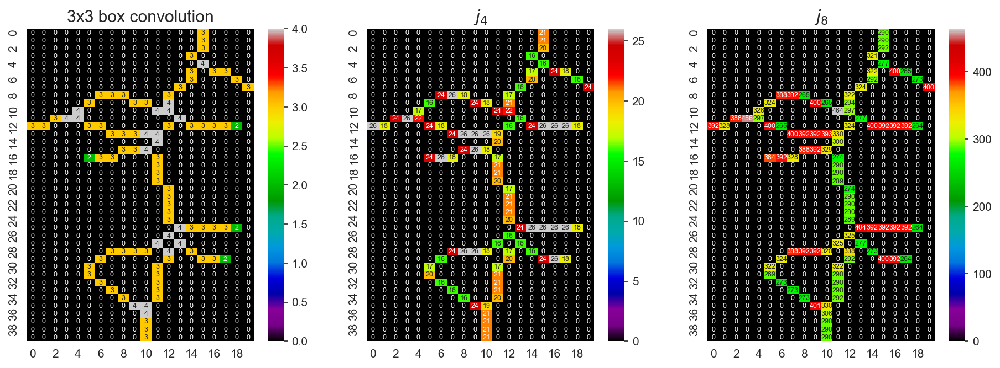

In [20]:
fig, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(15, 5))
sns.heatmap(n_crop, annot=True, fmt="d",
            cmap='nipy_spectral', ax=ax1, cbar=True,
            vmin=0, vmax=n_crop.max(), annot_kws={"size": 6}); ax1.set_title('3x3 box convolution')
sns.heatmap(neighbor_j4, annot=True, fmt="d",
            cmap='nipy_spectral', ax=ax2, cbar=True,
            vmin=0, vmax=neighbor_j4.max(), annot_kws={"size": 6}); ax2.set_title(r'$j_4$')
sns.heatmap(neighbor_j8, annot=True, fmt="d",
            cmap='nipy_spectral', ax=ax3, cbar=True,
            vmin=0, vmax=neighbor_j8.max(), annot_kws={"size": 6});  ax3.set_title(r'$j_8$');

# Dedicated pruning algorithms
 - Ideally model-based
 - Minimum branch length (using component labeling on the Count==3)
 - Minimum branch width (using the distance map values)
 

## Analyzing segment length

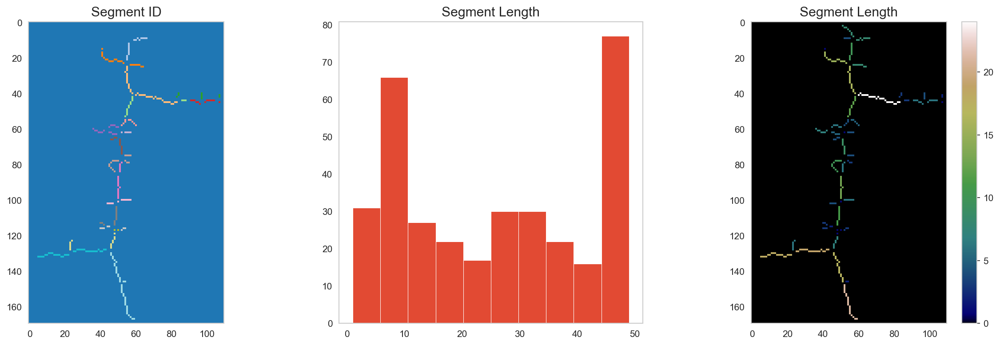

In [21]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))
lab_seg = label(neighbor_conv == 3)
ax1.imshow(lab_seg, cmap='tab20',interpolation='none')
ax1.set_title('Segment ID')
ax2.hist(lab_seg[lab_seg > 0])
ax2.set_title('Segment Length')

label_length_img = np.zeros_like(lab_seg)
for i in np.unique(lab_seg[lab_seg > 0]):
    label_length_img[lab_seg == i] = np.sum(lab_seg == i)

ll_ax = ax3.imshow(label_length_img, cmap='gist_earth',interpolation='none')
ax3.set_title('Segment Length'); plt.colorbar(ll_ax);

### Looking at the pruned skeleton

The skeleton should be pruned to only contain line segments with more than five pixels. This is done by thresholding the ```length_skeleton``` variable. The end-points and junctions are added to get a complete skeleton again. These pixels are picked from the convolved image, value '2' for end-points and any value >3 is for the endpoints.


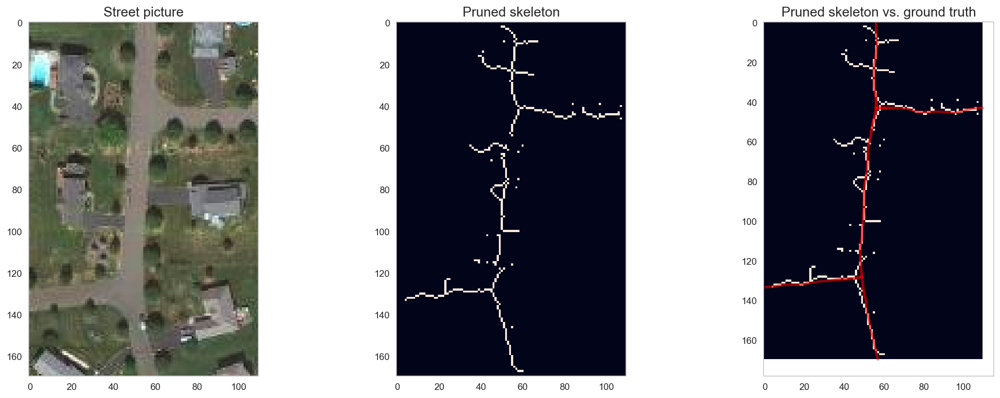

In [22]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 7))
length_skeleton =   (label_length_img > 5) + \
                    (neighbor_conv == 2) + \
                    (neighbor_conv > 3)        
ax1.imshow(im_crop); ax1.set_title('Street picture')
ax2.imshow(length_skeleton, interpolation='none'); ax2.set_title('Pruned skeleton')
ax3.imshow(length_skeleton, interpolation='none'); ax3.set_title('Pruned skeleton vs. ground truth')
ax3.scatter(mk_crop['x'], mk_crop['y'], s=mk_crop['width'],
            alpha=0.25, color='red', label='Ground Truth',);

## Analyzing maximum segment width

The segment width is a different metric for the skeleton pruning. The width is provided by computing the distance map of the original structure. Each segment can now be assigned the greatest distance fund at the pixels belonging to that segment.

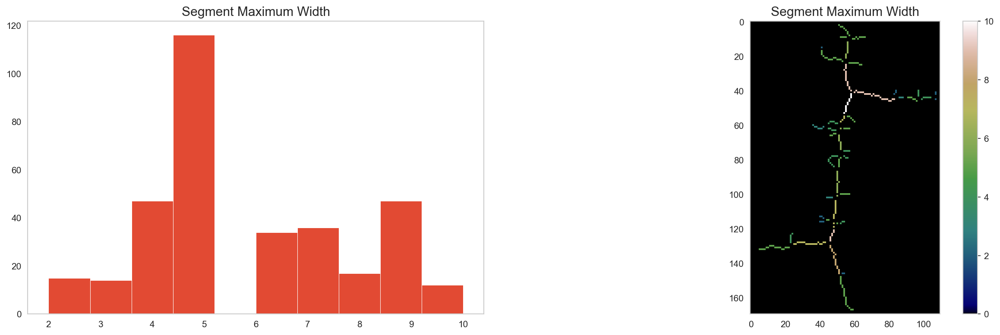

In [23]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

label_width_img = np.zeros_like(lab_seg)
for i in np.unique(lab_seg[lab_seg > 0]):
    label_width_img[lab_seg == i] = np.max(dist_map[lab_seg == i])

ax1.hist(label_width_img[label_width_img > 0])
ax1.set_title('Segment Maximum Width')


ll_ax = ax2.imshow(label_width_img, cmap='gist_earth',interpolation='none')
ax2.set_title('Segment Maximum Width'); plt.colorbar(ll_ax);

### Pruning using structure width

Pruning for the structure width, we use a threshold on the segment maximum width skeleton. Like for the lenght pruning, we again add the junctions and the end points.

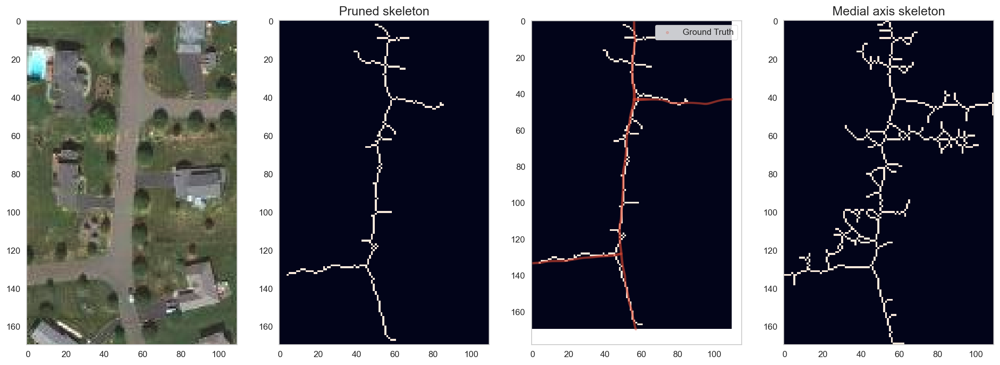

In [24]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 7))
width_skeleton =  (label_width_img > 4.5) \
                + (neighbor_conv == 2) \
                + (neighbor_conv > 3)
width_skeleton = label(width_skeleton) == 1
ax1.imshow(im_crop)
ax2.imshow(width_skeleton), ax2.set_title('Pruned skeleton')
ax3.imshow(width_skeleton)
ax3.scatter(mk_crop['x'], mk_crop['y'], s=mk_crop['width'],
            alpha=0.25, label='Ground Truth')
ax3.legend();
ax4.imshow(medial_axis(keep_lab_img, return_distance=False),interpolation='none'), ax4.set_title('Medial axis skeleton');

# Establish Topology
From the cleaned, pruned skeleton we can start to establish topology. 

Using the same criteria as before we can break down the image into 
- segments, 
- junctions, 
- and end-points

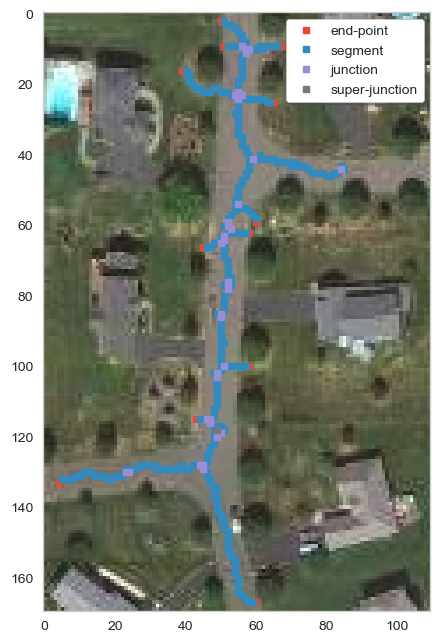

In [25]:
ws_neighbors = convolve(width_skeleton.astype(
    int), np.ones((3, 3)), mode='constant', cval=0)
ws_neighbors[~width_skeleton] = 0
fig, (ax1) = plt.subplots(1, 1, figsize=(5,10), dpi=100)
ax1.imshow(im_crop)
j_name = {1: 'dangling point', 2: 'end-point',
          3: 'segment', 4: 'junction', 5: 'super-junction'}
for j_count in np.unique(ws_neighbors[ws_neighbors > 0]):
    y_c, x_c = np.where(ws_neighbors == j_count)
    ax1.plot(x_c, y_c, 's',
             label=j_name.get(j_count, 'unknown'),
             markersize=5)

leg = ax1.legend(shadow=True, fancybox=True, frameon=True)

## Getting Topology in Image Space
We want to determine which nodes are directly connected in this image so we can extract a graph. If we take a simple case of two nodes connected by one edge and the bottom node connected to another edge going nowhere.

$$ \begin{bmatrix}
n & 0 & 0 & 0 \\
0 & e & 0 & 0 \\
0 & 0 & n & e
\end{bmatrix} $$

We can use component labeling to identify each node and each edge uniquely
### Node Labels

$$ N_{lab} = \begin{bmatrix}
1 & 0 & 0 & 0 \\
0 & 0 & 0 & 0 \\
0 & 0 & 2 & 0
\end{bmatrix} $$

### Edge Labels

$$E_{lab} = \begin{bmatrix}
0 & 0 & 0 & 0 \\
0 & 1 & 0 & 0 \\
0 & 0 & 0 & 2
\end{bmatrix} $$

We can then use a dilation operation on the nodes and the edges to see which overlap

### Small topology analysis example

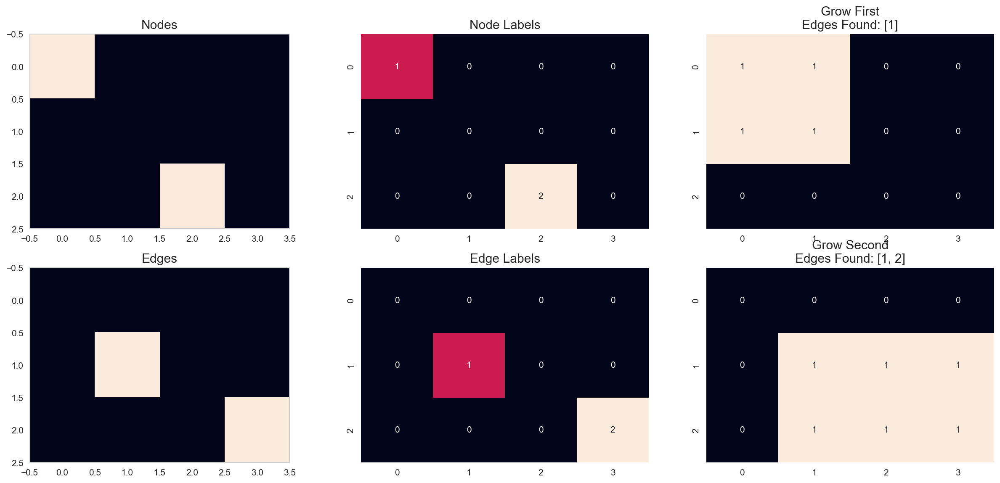

In [26]:
from skimage.morphology import dilation
n_img = np.zeros((3, 4))
e_img = np.zeros_like(n_img)
n_img[0, 0] = 1
e_img[1, 1] = 1
n_img[2, 2] = 1
e_img[2, 3] = 1

fig, ((ax1, ax3, ax5), (ax2, ax4, ax6)) = plt.subplots(2, 3, figsize=(20,9))

ax1.imshow(n_img)
ax1.set_title('Nodes')

ax2.imshow(e_img)
ax2.set_title('Edges')

# labeling
n_labs = label(n_img)

sns.heatmap(n_labs, annot=True, fmt="d", ax=ax3, cbar=False); ax3.set_title('Node Labels')

e_labs = label(e_img)

sns.heatmap(e_labs, annot=True, fmt="d", ax=ax4, cbar=False); ax4.set_title('Edge Labels')

# growing
n_grow_1 = dilation(n_labs == 1, np.ones((3, 3)))
sns.heatmap(n_grow_1, annot=True, fmt="d", ax=ax5, cbar=False); 
ax5.set_title('Grow First\n{} {}'.format('Edges Found:', [x for x in np.unique(e_labs[n_grow_1 > 0]) if x > 0]))

n_grow_2 = dilation(n_labs == 2, np.ones((3, 3)))
sns.heatmap(n_grow_2, annot=True, fmt="d", ax=ax6, cbar=False)
ax6.set_title('Grow Second\n{} {}'.format('Edges Found:', [x for x in np.unique(e_labs[n_grow_2 > 0]) if x > 0]));

### Analysing the topology of the street network

Edge 1 connects [1, 3]
Edge 2 connects [2, 3]
Edge 3 connects [3, 4]
Edge 4 connects [3, 6]
Edge 5 connects [5, 6]
Edge 6 connects [6, 7]
Edge 7 connects [6, 8]
Edge 8 connects [8, 9]
Edge 9 connects [8, 10]
Edge 10 connects [9]
Edge 11 connects [10, 11]
Edge 12 connects [10, 12]
Edge 13 connects [11]
Edge 14 connects [11, 14]
Edge 15 connects [11, 13]
Edge 16 connects [14]
Edge 17 connects [14, 15]
Edge 18 connects [14, 16]
Edge 19 connects [16, 17]
Edge 20 connects [16, 17]
Edge 21 connects [17, 18]
Edge 22 connects [18]
Edge 23 connects [18, 19]
Edge 24 connects [19, 20]
Edge 25 connects [19, 21]
Edge 26 connects [21]
Edge 27 connects [21, 23]
Edge 28 connects [22, 23]
Edge 29 connects [23, 24]
Edge 30 connects [24]
Edge 31 connects [24]
Edge 32 connects [24, 25]
Edge 33 connects [25, 26]
Edge 34 connects [26]
Edge 35 connects [26, 27]
Edge 36 connects [25, 28]


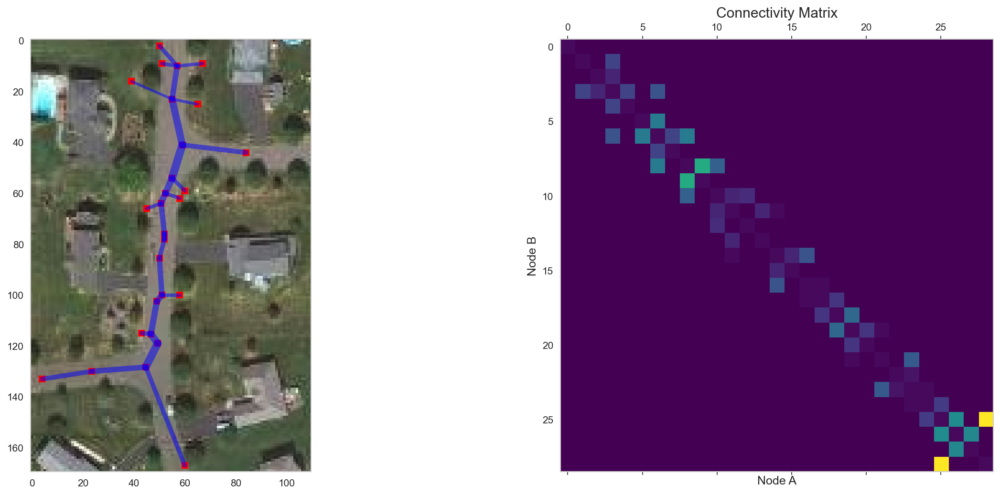

In [27]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
node_id_image = label((ws_neighbors > 3) | (ws_neighbors == 2))
edge_id_image = label(ws_neighbors == 3)

ax1.imshow(im_crop)

node_dict = {}
for c_node in np.unique(node_id_image[node_id_image > 0]):
    y_n, x_n = np.where(node_id_image == c_node)
    node_dict[c_node] = {'x': np.mean(x_n),
                         'y': np.mean(y_n),
                         'width': np.mean(dist_map[node_id_image == c_node])}
    ax1.plot(np.mean(x_n), np.mean(y_n), 'rs')

edge_dict = {}
edge_matrix = np.eye(len(node_dict)+1)
for c_edge in np.unique(edge_id_image[edge_id_image > 0]):
    edge_grow_mask = dilation(edge_id_image == c_edge, np.ones((3, 3)))
    v_nodes = np.unique(node_id_image[edge_grow_mask > 0])
    v_nodes = [v for v in v_nodes if v > 0]
    print('Edge', c_edge, 'connects', v_nodes)
    if len(v_nodes) == 2:
        edge_dict[c_edge] = {'start': v_nodes[0],
                             'end': v_nodes[-1],
                             'length': np.sum(edge_id_image == c_edge),
                             'euclidean_distance': np.sqrt(np.square(node_dict[v_nodes[0]]['x'] -
                                                                     node_dict[v_nodes[-1]]['x']) +
                                                           np.square(node_dict[v_nodes[0]]['y'] -
                                                                     node_dict[v_nodes[-1]]['y'])
                                                           ),
                             'max_width': np.max(dist_map[edge_id_image == c_edge]),
                             'mean_width': np.mean(dist_map[edge_id_image == c_edge])}
        edge_matrix[v_nodes[0], v_nodes[-1]] = np.sum(edge_id_image == c_edge)
        edge_matrix[v_nodes[-1], v_nodes[0]] = np.sum(edge_id_image == c_edge)
        s_node = node_dict[v_nodes[0]]
        e_node = node_dict[v_nodes[-1]]
        ax1.plot([s_node['x'], e_node['x']],
                 [s_node['y'], e_node['y']], 'b-', linewidth=np.mean(dist_map[edge_id_image == c_edge]), alpha=0.5)

ax2.matshow(edge_matrix, cmap='viridis')
ax2.set_title('Connectivity Matrix'); ax2.set_xlabel('Node A'); ax2.set_ylabel('Node B');

# Skeleton: Tortuosity

One of the more interesting ones in material science is called tortuosity and it is defined as the ratio between the arc-length of a _segment_ and the distance between its starting and ending points. 
$$ \tau = \frac{L}{C} $$

A high degree of [tortuosity](http://en.wikipedia.org/wiki/Tortuosity) indicates that the network is convoluted and is important when estimating or predicting flow rates.
Specifically
- in geology it is an indication that diffusion and fluid transport will occur more slowly
- in analytical chemistry it is utilized to perform size exclusion chromatography
- in vascular tissue it can be a sign of pathology.

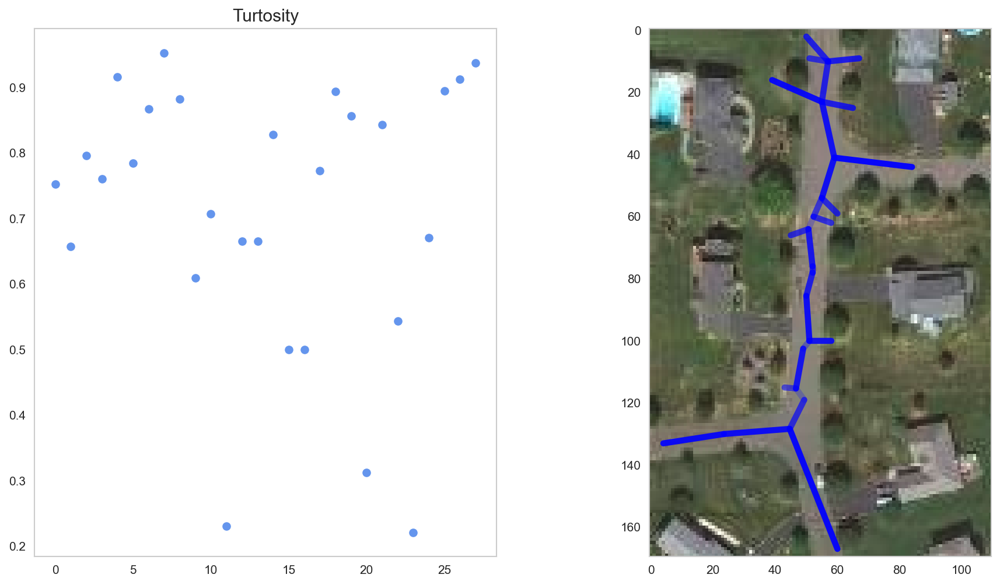

In [28]:
fig, (ax0,ax1) = plt.subplots(1, 2, figsize=(15, 8))
ax1.imshow(im_crop)
t=[]
for _, d_values in edge_dict.items():
    v_nodes = [d_values['start'], d_values['end']]
    t = t + [d_values['length']/d_values['euclidean_distance']]
    s_node = node_dict[v_nodes[0]]
    e_node = node_dict[v_nodes[-1]]
    ax1.plot([s_node['x'], e_node['x']],
             [s_node['y'], e_node['y']], 'b-',
             linewidth=5, alpha=d_values['length']/d_values['euclidean_distance'])
ax0.plot(t,'o', color='cornflowerblue'); ax0.set_title('Turtosity'); 

## Further ways to visualize the network

1. Randomly organized graph
    - Nodes colored by the width
    - Edges colored by the length and width set by segment width
2. Add width and length information in the original picture

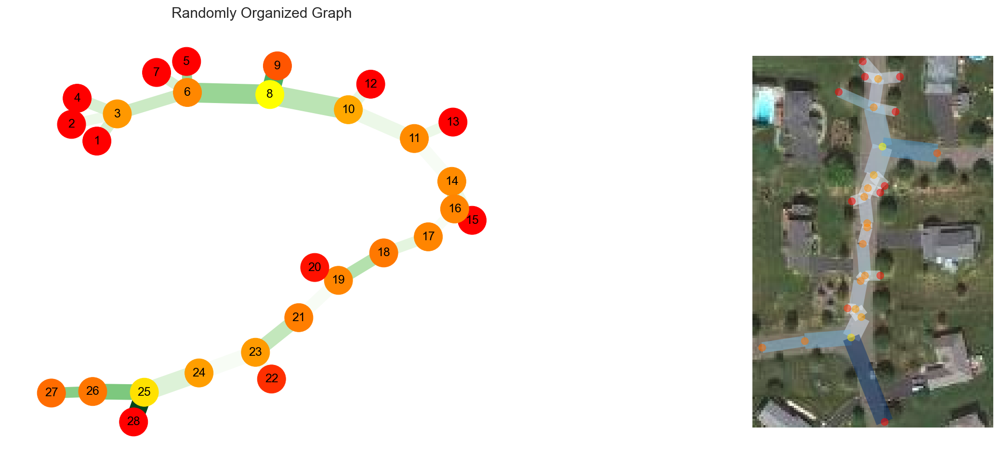

In [29]:
import networkx as nx
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
G = nx.Graph()
for k, v in node_dict.items():
    G.add_node(k, weight=v['width'])
for k, v in edge_dict.items():
    G.add_edge(v['start'], v['end'], **v)
nx.draw_spring(G, ax=ax1, with_labels=True,
               node_color=[node_dict[k]['width']
                           for k in sorted(node_dict.keys())],
               node_size=800,
               cmap=plt.cm.autumn,
               edge_color=[G.edges[k]['length'] for k in list(G.edges.keys())],
               width=[2*G.edges[k]['max_width'] for k in list(G.edges.keys())],
               edge_cmap=plt.cm.Greens)
ax1.set_title('Randomly Organized Graph')
ax2.imshow(im_crop)
nx.draw(G,
        pos={k: (v['x'], v['y']) for k, v in node_dict.items()},
        ax=ax2,
        node_color=[node_dict[k]['width'] for k in sorted(node_dict.keys())],
        node_size=50,
        cmap=plt.cm.autumn,
        edge_color=[G.edges[k]['length'] for k in list(G.edges.keys())],
        width=[2*G.edges[k]['max_width'] for k in list(G.edges.keys())],
        edge_cmap=plt.cm.Blues,
        alpha=0.5,
        with_labels=False)

## Graph Analysis
Once the data has been represented in a graph form, we can begin to analyze some of graph aspects of it, like the degree and connectivity plots.

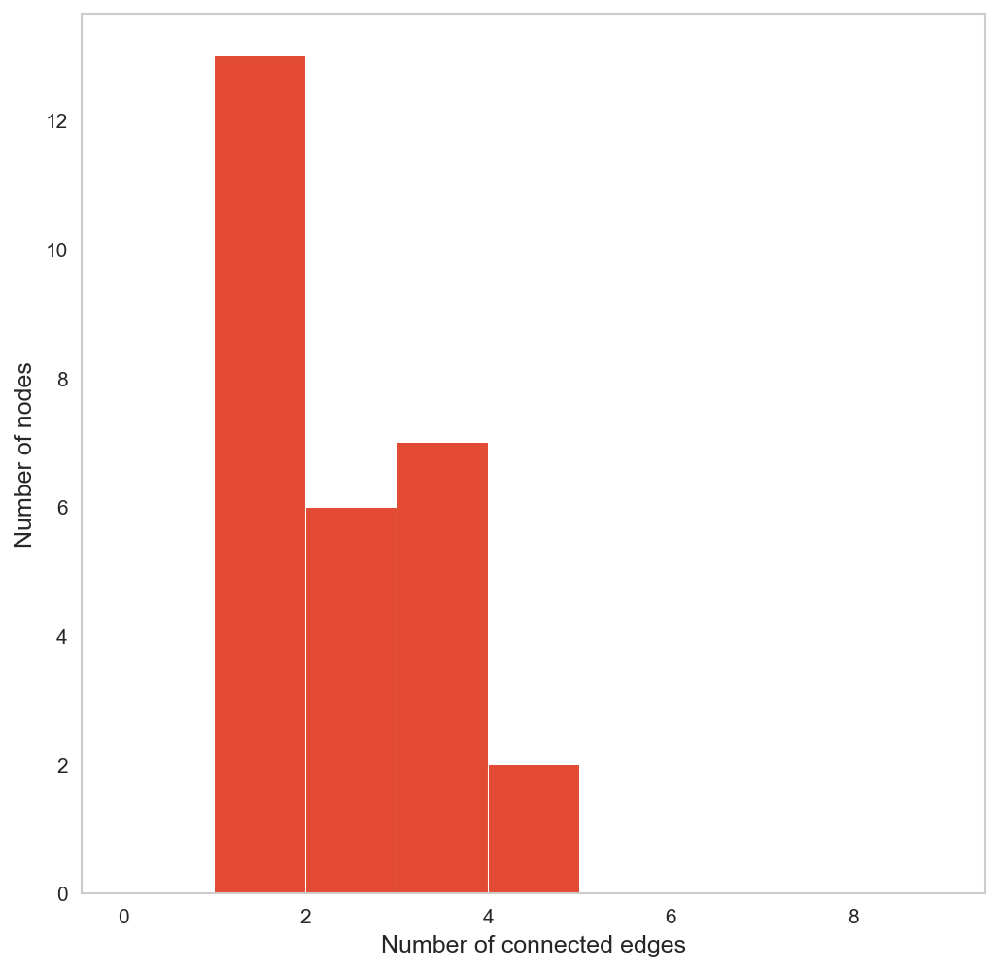

In [30]:
degree_sequence = sorted([d for n, d in G.degree()],
                         reverse=True)  # degree sequence
plt.hist(degree_sequence, bins=np.arange(10)), plt.xlabel('Number of connected edges'), plt.ylabel('Number of nodes');

# Skeletons going 3D

- Object topology must still be preserved
- More complex neighborhoods to analyze

[A skeletonization algorithm survey](https://doi.org/10.1016/j.patrec.2015.04.006)

## Application of 3D skeletons: Root networks

<table>
<tr><th><b>Motivation</b></th>
<th><b>A root network</b></th>
</tr>
<tr>
<td>
<b>Why?</b>
<ul>
<li>Soil stability</li>
<li>Water uptake</li>
<li>Growth under different contitions</li>
</ul>
    
<b>Analysis of</b>
<ul>
    <li>Root network morphology</li>
    <ul>
    <li>Segment length</li>
    <li>Branching</li>
    <li>Branch orientation</li>
        </ul>
<li>Influence volumes</li>
</ul>        
</td>
<td>
<video controls loop autoplay src="movies/root.mp4" height="512px" type="video/mp4" />
</td></tr></table>

### Load volume with roots
The data is zipped in the repos, unzip before continuing

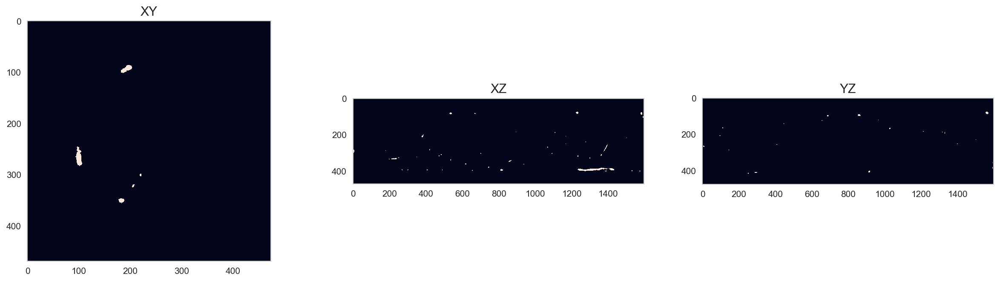

In [35]:
root = np.load('data/Cropped_prediction_8bit.npy')
fig,(ax1,ax2,ax3) = plt.subplots(1,3,figsize=(20,5))
ax1.imshow(root[:,:,700],interpolation='none'); ax1.set_title('XY')
ax2.imshow(root[:,220,:],interpolation='none'); ax2.set_title('XZ')
ax3.imshow(root[220,:,:],interpolation='none'); ax3.set_title('YZ');

### Let's look at the projection instead

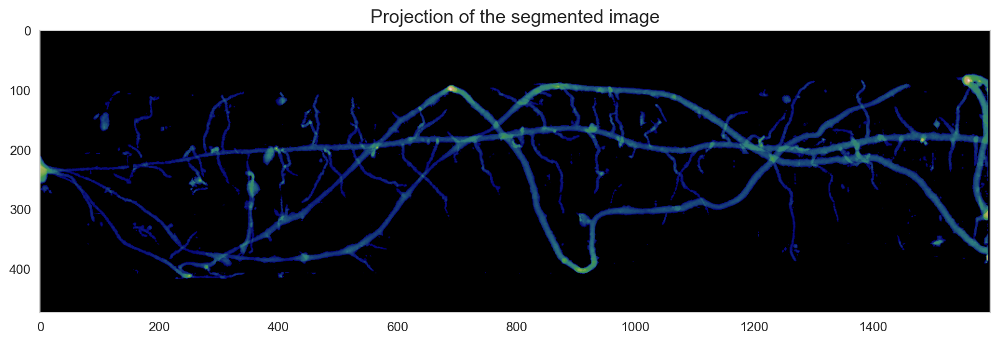

In [36]:
plt.figure(figsize=(15,4))
plt.imshow(root.mean(axis=0),cmap='gist_earth'), plt.title('Projection of the segmented image');

## Create the 3D skeleton

In [37]:
skel = skeletonize_3d(root)

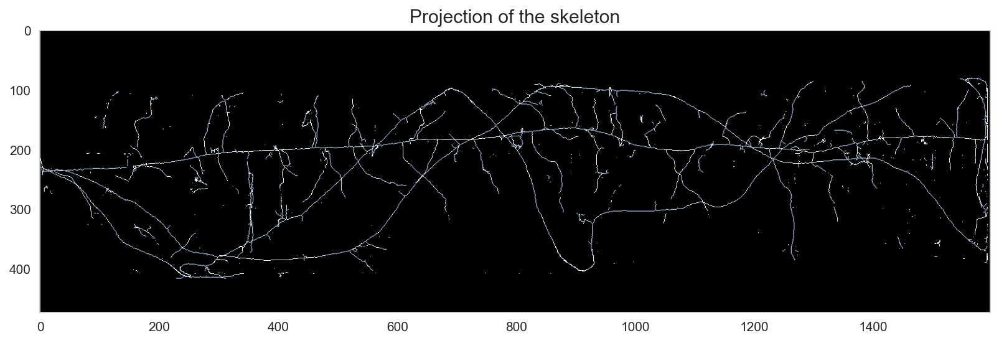

In [38]:
plt.figure(figsize=(15,4))
plt.imshow(skel.max(axis=0), cmap="bone"), plt.title('Projection of the skeleton');

### Detailed 3D view of skeleton

<table>
<tr><th>
<b>Segmented root</b>
</th>
<th>
<b>Root skeleton</b> 
</th>
</tr>
<tr>
    <td><img src="figures/root_prediction.png" style="height:400px" /></td>
    <td><img src="figures/root_skeleton.png" style="height:400px" /></td>
</tr></table>


# Segmenting touching items

Watershed is a method for segmenting objects without using component labeling. 
- It utilizes the shape of structures to find objects
- From the distance map we can make out substructures with our eyes
- But how to we find them?!


## Watershed

We use a sample image now from the [Datascience Bowl 2018 from Kaggle](https://www.kaggle.com/c/data-science-bowl-2018). The challenge is to identify nuclei in histology images to eventually find cancer better. The winner tweeted about the solution [here](https://twitter.com/alxndrkalinin/status/986260848376197120)

```{figure} figures/Tweet-AlexandrKalinin.png
---
scale: 75%
---
Tweet by Alexandr Kalinin
```

<img src="figures/Tweet-AlexandrKalinin.png" style="height:600px" />

## Let's load a cell image

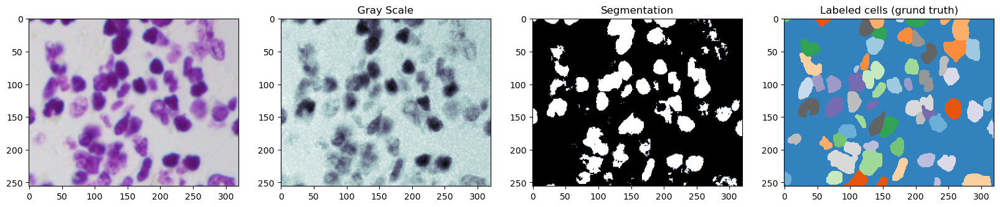

In [3]:
from skimage.filters import threshold_otsu
from skimage.color import rgb2hsv
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
%matplotlib inline

rgb_img = imread("../Lecture-02/figures/dsb_sample/slide.png")[:, :, :3]
gt_labs = imread("../Lecture-02/figures/dsb_sample/labels.png")
bw_img = rgb2hsv(rgb_img)[:, :, 2]

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 6), dpi=100)
ax1.imshow(rgb_img, cmap='bone')
ax2.imshow(bw_img, cmap='bone'),ax2.set_title('Gray Scale')
ax3.imshow(bw_img < threshold_otsu(bw_img), cmap='bone'), ax3.set_title('Segmentation')
ax4.imshow(gt_labs, cmap='tab20c',interpolation='None'),ax4.set_title('Labeled cells (grund truth)');

##  Try component labeling

In [4]:
from skimage.morphology import label
bw_roi       = bw_img[75:110:2, 125:150:2]
bw_roi_seg   = bw_roi < threshold_otsu(bw_img)
bw_roi_label = label(bw_roi_seg)

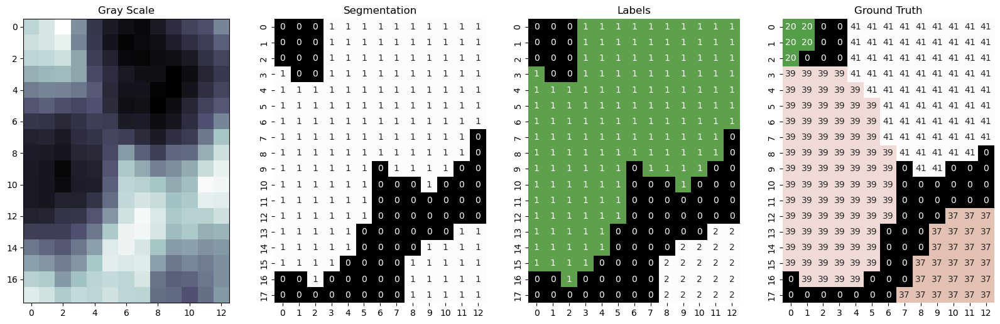

In [5]:
import seaborn as sns
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 6), dpi=100)
ax1.imshow(bw_roi, cmap='bone'); ax1.set_title('Gray Scale')
sns.heatmap(bw_roi_seg, annot=True, fmt="d",
            ax=ax2, cbar=False, cmap='gist_earth'); ax2.set_title('Segmentation');  
sns.heatmap(bw_roi_label, annot=True, fmt="d",
            ax=ax3, cbar=False, cmap='gist_earth'); ax3.set_title('Labels')
sns.heatmap(gt_labs[75:110:2, 125:150:2], annot=True,
            fmt="d", ax=ax4, cbar=False, cmap='gist_earth'); ax4.set_title('Ground Truth');

# Watershed: Flowing Downhill

We can imagine watershed as waterflowing down hill into basins. The topology in this case is given by the distance map

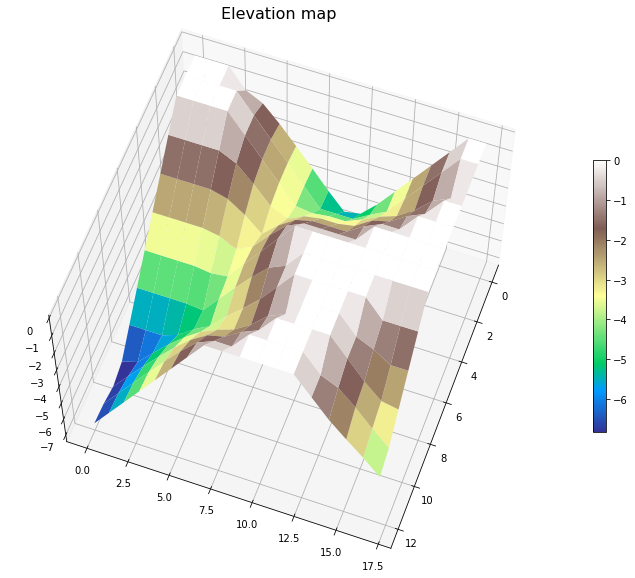

In [6]:
from scipy.ndimage import distance_transform_edt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(projection='3d')
bw_roi_dmap = distance_transform_edt(bw_roi_seg) # The distance map needed for the segmentation

# Plot the surface.
t_xx, t_yy = np.meshgrid(np.arange(bw_roi_dmap.shape[1]),np.arange(bw_roi_dmap.shape[0]))
surf = ax.plot_surface(t_xx, t_yy,-1*bw_roi_dmap, cmap="terrain",linewidth=0.25, antialiased=True)

# Customize the z axis.
ax.view_init(60, 20)
# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5); ax.set_title('Elevation map',fontsize=16);

## Preparations for watershed segmentation
We need to create a seed image
1. Segment image
2. Compute distance map
3. Identify local maxima

In [7]:
from skimage.feature import peak_local_max
from scipy.ndimage import distance_transform_edt

coords = peak_local_max(distance_transform_edt(bw_roi_seg), footprint=np.ones((3, 3)),
                        labels=bw_roi_seg, exclude_border=False)
roi_local_maxi = np.zeros(bw_roi_dmap.shape, dtype=bool)
roi_local_maxi[tuple(coords.T)] = True
labeled_maxi = label(roi_local_maxi)

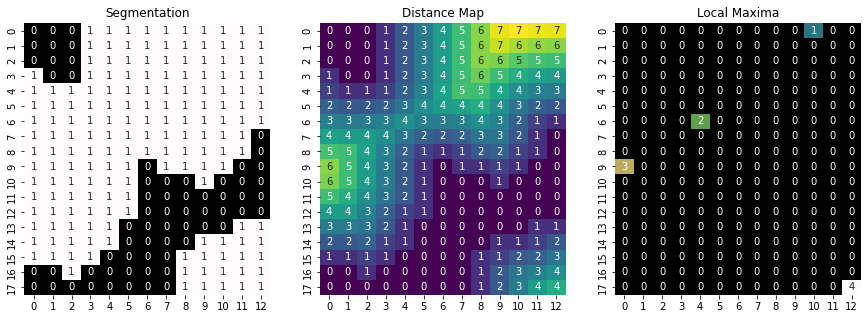

In [8]:
import seaborn as sns
fig, ax= plt.subplots(1, 3, figsize=(15,5))
sns.heatmap(bw_roi_seg,   annot=True, fmt="d",    ax=ax[0], cbar=False, cmap='gist_earth')
ax[0].set_title('Segmentation')
sns.heatmap(bw_roi_dmap,  annot=True, fmt="1.0f", ax=ax[1], cbar=False, cmap='viridis')
ax[1].set_title('Distance Map');
sns.heatmap(labeled_maxi, annot=True, fmt="1.0f", ax=ax[2], cbar=False, cmap='gist_earth')
ax[2].set_title('Local Maxima');

## Run watershed

In [9]:
from skimage.segmentation import watershed
ws_labels = watershed(-bw_roi_dmap, labeled_maxi, mask=bw_roi_seg)

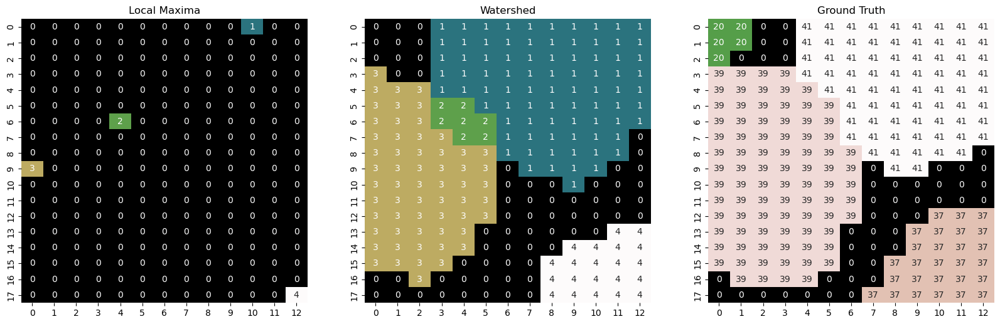

In [10]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6), dpi=100)
sns.heatmap(labeled_maxi, annot=True, fmt="1.0f",
            ax=ax1, cbar=False, cmap='gist_earth'); ax1.set_title('Local Maxima')

sns.heatmap(ws_labels, annot=True, fmt="d",
            ax=ax2, cbar=False, cmap='gist_earth'); ax2.set_title('Watershed')

sns.heatmap(gt_labs[75:110:2, 125:150:2], annot=True,
            fmt="d", ax=ax3, cbar=False, cmap='gist_earth'); ax3.set_title('Ground Truth');

## Removing too small elements - method 1
One of the components (Label=2) is too small!

We can remove it by deleting unwanted seeds.
- seed belonging to the bottom 10 percentile of areas 
- rerunning watershed

In [11]:
label_area_dict = {i: np.sum(ws_labels == i)
                   for i in np.unique(ws_labels[ws_labels > 0])}
clean_label_maxi = labeled_maxi.copy()
area_cutoff = np.percentile(list(label_area_dict.values()), 10)
print('Cutoff at {0:0.2f}'.format(area_cutoff))
for i, k in label_area_dict.items():
    print('Label: ', i, 'Area:', k, 'Keep:', k > area_cutoff)
    if k <= area_cutoff:
        clean_label_maxi[clean_label_maxi == i] = 0

Cutoff at 11.20
Label:  1 Area: 82 Keep: True
Label:  2 Area: 7 Keep: False
Label:  3 Area: 59 Keep: True
Label:  4 Area: 21 Keep: True


### Watershed after removing labels

In [12]:
ws_labels = watershed(-bw_roi_dmap, clean_label_maxi, mask=bw_roi_seg)

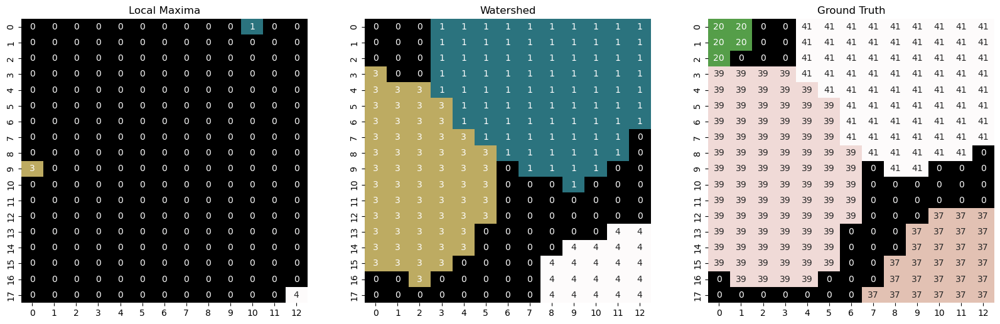

In [13]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6), dpi=100)
sns.heatmap(clean_label_maxi, annot=True, fmt="1.0f",
            ax=ax1, cbar=False, cmap='gist_earth'); ax1.set_title('Local Maxima')



sns.heatmap(ws_labels, annot=True, fmt="d",
            ax=ax2, cbar=False, cmap='gist_earth'); ax2.set_title('Watershed')

sns.heatmap(gt_labs[75:110:2, 125:150:2], annot=True,
            fmt="d", ax=ax3, cbar=False, cmap='gist_earth');ax3.set_title('Ground Truth');

## Scaling back up
Now we can perform the operation on the whole image and see how the results look


10% cutoff 35.0 Removed 25 components


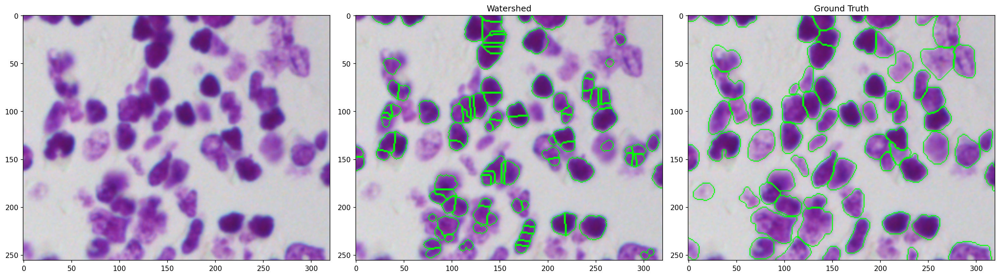

In [15]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6), dpi=150)
ax1.imshow(rgb_img, cmap='bone')

bw_seg_img = opening(bw_img < threshold_otsu(bw_img), disk(3))

bw_dmap  = distance_transform_edt(bw_seg_img)
bw_peak_coords = peak_local_max(bw_dmap.copy(), footprint=np.ones((3, 3)),
                                labels=bw_seg_img, exclude_border=True)
bw_dmap[bw_dmap<0]=0
bw_peaks = np.zeros_like(bw_dmap)
bw_peaks[tuple(bw_peak_coords.T)]=1
bw_peaks = label(bw_peaks)
ws_labels = watershed(-bw_dmap, bw_peaks, mask=bw_seg_img)

label_area_dict = {i: np.sum(ws_labels == i)
                   for i in np.unique(ws_labels[ws_labels > 0])}

clean_label_maxi = bw_peaks.copy()
lab_areas = list(label_area_dict.values())
area_cutoff = np.percentile(lab_areas, 20)
print('10% cutoff', area_cutoff, 'Removed', np.sum(
    np.array(lab_areas) < area_cutoff), 'components')
for i, k in label_area_dict.items():
    if k <= area_cutoff:
        clean_label_maxi[clean_label_maxi == i] = 0

ws_labels = watershed(-bw_dmap, clean_label_maxi, mask=bw_seg_img)

ax2.imshow(mark_boundaries(label_img=ws_labels,
                           image=rgb_img, color=(0, 1, 0))); ax2.set_title('Watershed')

ax3.imshow(mark_boundaries(label_img=gt_labs, image=rgb_img, color=(0, 1, 0))); 
ax3.set_title('Ground Truth');
plt.tight_layout(); 
fig.savefig('ws_full.png',dpi=300);

## No fantastic performance :-(

<img src="figures/ws_full.png" />

### We have:
- many over segmented cells
- missing cells


### Why bad performance?

__Missing objects__
- Too simple thresholding method was used (Otsu)

__Over segmentation__
- Irregular shapes and misclassified pixels produce too many local maxima in the elevation map

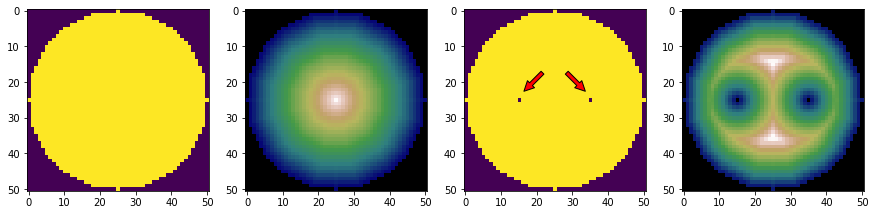

In [40]:
import matplotlib.patches as mpatches
fig,ax=plt.subplots(1,4, figsize=(15,4)); ax=ax.ravel()
d=disk(25)
ax[0].imshow(d,interpolation='none')
ax[1].imshow(distance_transform_edt(d), cmap= 'gist_earth' )
d[25,15]=0; d[25,35]=0
ax[2].imshow(d,interpolation='none')

arrow = mpatches.FancyArrowPatch((22, 17), (16, 23),
                                  mutation_scale=20,fc='red')
ax[2].add_patch(arrow)
arrow = mpatches.FancyArrowPatch((28, 17), (34, 23),
                                  mutation_scale=20,fc='red')
ax[2].add_patch(arrow)

ax[3].imshow(distance_transform_edt(d), cmap= 'gist_earth' );

__Solutions__ 
- Find better segmentation approach than only histogram
- Use morphological algorithms like h-max and min-impose [Soille, 1999](https://doi.org/10.1007/978-3-662-03939-7)

## Removing too small elements - method 2
The over segmentation is a know problem of the watershed segmentation.

A method proposed by [Soille, 1999](https://doi.org/10.1007/978-3-662-03939-7) is to
- Analyze the distance map to reject low amplitude peaks.
- Strenghten the local minima.

This can be done using methods called reconstruction by dilation $R^{\delta}_{f}(g)$ and erosion $R^{\varepsilon}_{f}(g)$. These are iterative algorithms that reconstructs a mutual minimum or maximum between a mask image and the reconstructed image.

### Use h-max to find peaks

- The find peaks method finds any peak in the image.
- h-Max add the criterion that the peak must be at least $h$ greylevels higher than the surroundings to produce a marker.

In [48]:
from skimage.morphology import h_maxima

roi_local_maxi = peak_local_max(bw_roi_dmap.copy(), footprint=np.ones((3, 3)),
                                labels=bw_roi_seg, exclude_border=False)
bw_roi_dmap[bw_roi_dmap<0]=0
bw_peaks = np.zeros_like(bw_roi_dmap)
bw_peaks[tuple(roi_local_maxi.T)]=1
bw_peaks

h=2
hmax=h_maxima(bw_roi_dmap,h=h)

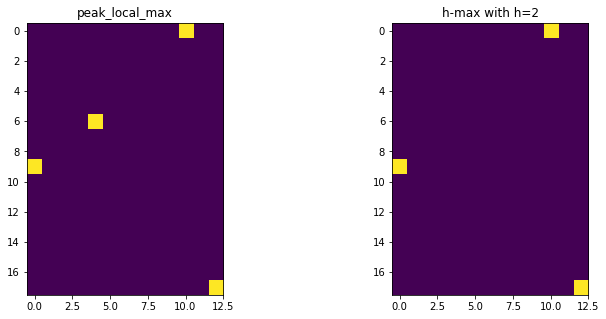

In [49]:
fig, ax = plt.subplots(1,2,figsize=(12,5))
ax[0].imshow(bw_peaks); ax[0].set_title('peak_local_max')
ax[1].imshow(hmax); ax[1].set_title("h-max with h={}".format(h));

### Use min-impose to strengthen the peaks

$$R^{\varepsilon}_{(f+1)\hat{}f_m}(f_m)$$

with 

$$f_m(p)=\begin{cases} 0 &\mbox{if } p \mbox{ belongs to a marker}\\
t_{max} & \mbox{otherwise} \end{cases}$$

_Compare to pulling a wrinkled membrane._

In [50]:
import skimage.morphology.greyreconstruct as gr

def min_impose(dimg,markers) :
    fm=markers.copy()
    fm[markers != 0] = 0
    fm[markers == 0] = dimg.max()
    dimg2 = np.minimum(fm,dimg+1)
    res   = gr.reconstruction(fm,dimg2,method='erosion')
    
    return res

### Testing minimpose and h-min - cropped image

In [ ]:
d = bw_roi_dmap.max()-bw_roi_dmap

ws0 = watershed(-bw_roi_dmap, label(hmax), mask=bw_roi_seg)
m3=label(hmax)
minimp_h=min_impose(d,hmax)

ws  = watershed(minimp_h,m3,mask=bw_roi_seg)

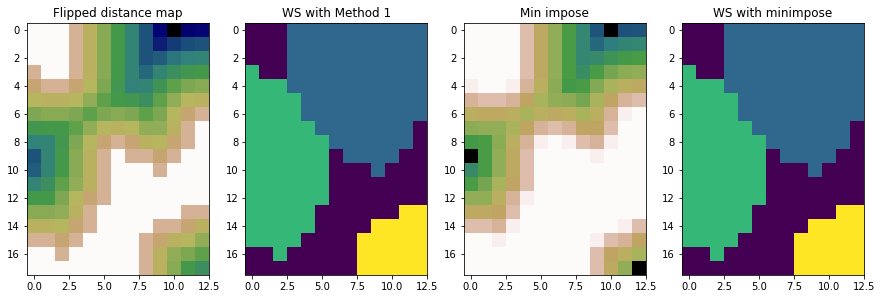

In [54]:
fig,ax = plt.subplots(1,4,figsize=(15,5))
ax[0].imshow(d, cmap='gist_earth'); ax[0].set_title('Flipped distance map')
ax[1].imshow(ws0); 
ax[1].set_title('WS with Method 1')

ax[2].imshow(minimp_h,cmap='gist_earth'); 
ax[2].set_title('Min impose')

ax[3].imshow(ws); 
ax[3].set_title('WS with minimpose');

### Testing minimpose and h-min - full image

/var/folders/hj/l3z3z7bj663f4wp4vlx69lt40000nw/T/ipykernel_98630/4033208985.py:4: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  m0  = label(peak_local_max(dmap, indices=False, footprint=np.ones((3, 3)), labels=seg, exclude_border=False))


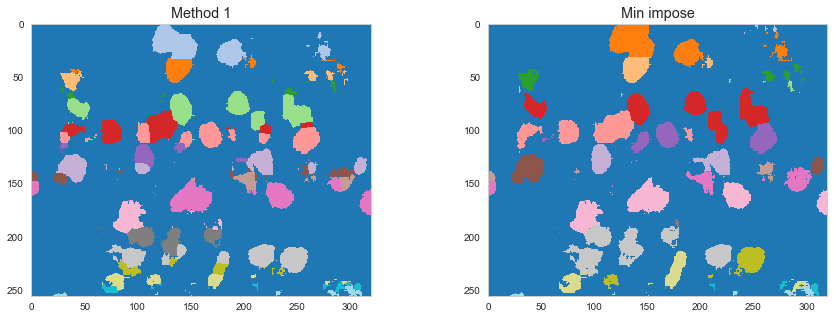

In [42]:
seg=bw_img < threshold_otsu(bw_img)
dmap = distance_transform_edt(seg)

m0  = label(peak_local_max(dmap, indices=False, footprint=np.ones((3, 3)), labels=seg, exclude_border=False))

ws0 = watershed(-dmap, m0, mask=seg)
                
fig,ax=plt.subplots(1,2,figsize=(15,5))
ax[0].imshow(ws0,cmap="tab20",interpolation='None'); ax[0].set_title('Method 1')

h=1
localmax = h_maxima(dmap,h)
rdmap    = dmap.max()-dmap
marker   = label(localmax)
ws1 = watershed(min_impose(rdmap,marker),marker,mask=seg)

ax[1].imshow(ws1,cmap="tab20",interpolation='None'); ax[1].set_title('Min impose');

# Color maps for many labels
## Standard color maps
It is hard to identify all items in a watershed segmented image

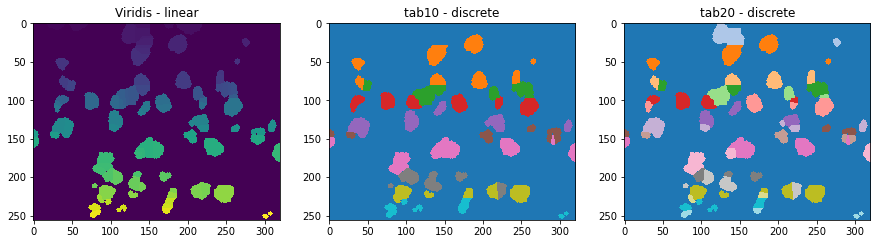

In [56]:
fig, ax = plt.subplots(1,3,figsize=(15,4))
ax[0].imshow(ws_labels,cmap='viridis',interpolation='none'); 
ax[0].set_title('Viridis - linear')

ax[1].imshow(ws_labels,cmap='tab10',interpolation='none');  
ax[1].set_title('tab10 - discrete')

ax[2].imshow(ws_labels,cmap='tab20',interpolation='none');
ax[2].set_title('tab20 - discrete');

- Linear colormaps like viridis appear like a gradient. 
- Discrete colormaps mostly have too few categories, multiple item have the same color.

## Custom colormaps

Create custom colormaps with the same number of entries as labels

__Random colors__

In [64]:
from scipy.stats import ortho_group
from matplotlib.colors import ListedColormap

def randomCM(N, low=0.2, high=1.0,seed=42, bg=0) :
    np.random.seed(seed=seed)
    clist=np.random.uniform(low=low,high=high,size=[N,3]); 
    m = ortho_group.rvs(dim=3)
    if bg is not None : clist[0,:]=bg;
        
    rmap = ListedColormap(clist)
    
    return rmap

__Golden ratio__

In [65]:
def goldenCM(N,increment=1.0,s=0.5,v=0.7,bg=0) :
    phi= 0.5*(np.sqrt(5)-1)
    
    hsv = np.zeros([N,3]);
    hsv[:, 0] = increment*phi*np.linspace(0,N-1,N)-np.floor(increment*phi*np.linspace(0,N-1,N))
    hsv[:, 1] = s
    hsv[:, 2] = v
    rgb = hsv2rgb(hsv)
    if bg is not None : rgb[0,:]=bg    
    cm = ListedColormap(rgb) 
    return cm

### Trying the custom colormaps

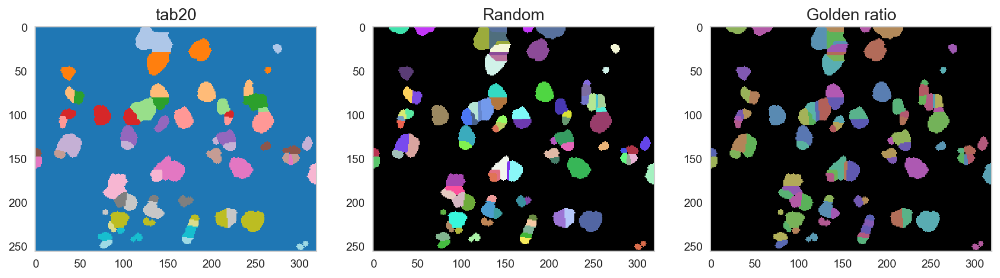

In [68]:
fig, ax =plt.subplots(1,3,figsize=(15,4))
ax[0].imshow(ws_labels,cmap='tab20',interpolation='none');   ax[0].set_title('tab20');
ax[1].imshow(ws_labels,cmap=randomCM(ws_labels.max()),interpolation='none'); ax[1].set_title('Random')
ax[2].imshow(ws_labels,cmap=goldenCM(ws_labels.max()),interpolation='none'); ax[2].set_title('Golden ratio');

# Separating grain packings

It is very common to scan grain packings in different fields of materials science. 

In this example, 
- we have a volume with grains from two size fractions (500x500x300 voxels).
- The purpose of this packing is to study the water flow properties at the interface between the fractions.

__Our task__ 
- We want to separate the two fractions

## Workflow to separate grain packings

0. Load the data
1. Image preparation
    - Noise reduction
    - Binarization
    - Clean misclassified voxels
2. Label the grains
    - Compute distance map
    - Identify and label grain peaks
    - Use watershed segmentation
3. Categorize the grains
    - Compute region information
    - Remove tiny and huge regions
    - Inspect the region properties
    - k-means clustering
4. Assign fraction class to each grain

## Load and inspect the data

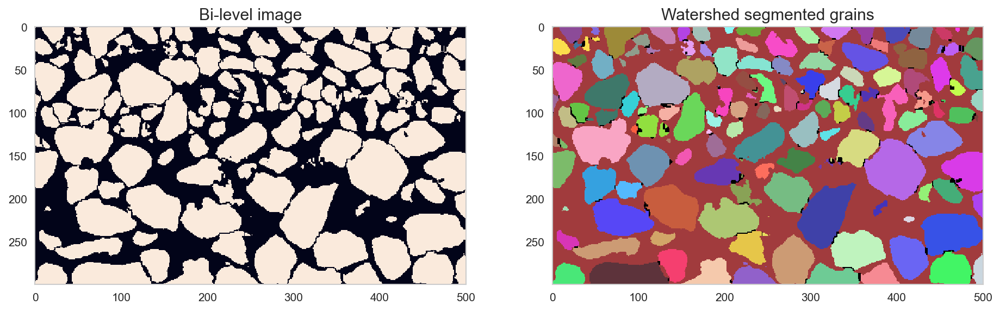

In [77]:
bi = np.load('data/grains.npy')
ws = np.load('data/ws_grains.npy')

fig, ax = plt.subplots(1,2,figsize=(15,7))
ax[0].imshow(bi[250,:,:].transpose(),interpolation='none'); 
ax[0].set_title('Bi-level image')
ax[1].imshow(ws[250,:,:].transpose(), randomCM(ws[250,:,:].max()-ws[250,:,:].min()),interpolation='none');
ax[1].set_title('Watershed segmented grains');

## Compute region properties

In [78]:
from skimage.measure import regionprops_table
import pandas as pd
import seaborn as sns

rp = pd.DataFrame.from_dict(regionprops_table(ws,properties=['label', 'area', 'centroid']))
rp.sample(10)

,label,area,centroid-0,centroid-1,centroid-2
1162,1163,22925,318.859804,67.974438,118.373871
302,303,5812,5.142980,232.431005,23.679800
1088,1089,11769,358.215651,33.497408,112.796329
1490,1491,74029,143.537506,240.031299,228.602791
1539,1540,98303,119.870563,350.800861,251.867105
545,546,157837,420.918549,172.511186,62.687317
1173,1174,58600,65.619471,325.458464,114.302287
486,487,29707,389.467466,105.650183,44.948665
1011,1012,20103,418.772522,443.066060,101.310799
1020,1021,49470,36.266161,23.013564,99.779119


In [79]:
print("Min area {}, Max area {}, Median area {}".format(rp['area'].min(),rp['area'].max(), rp['area'].median()))

Min area 1, Max area 27663915, Median area 12251.5


### Prune the table

We saw that there are items in the image are either huge or very tiny.

Let's filter the region property table and extract the gains with relaistic size:
- The huge item is the pore space

In [80]:
rp['fg']    = rp['area']<1e7

- The small items are grain fractions at the boundary or over segmentations

In [81]:
rp['small'] = rp['area']<1000

rp.tail(5)

,label,area,centroid-0,centroid-1,centroid-2,fg,small
1675,1676,264,168.295455,0.000000,118.443182,True,True
1676,1677,275,180.963636,1.781818,27.734545,True,True
1677,1678,1416,15.379944,496.715395,292.586158,True,False
1678,1679,1003,217.634098,496.695912,204.835494,True,False
1679,65535,27663915,248.513673,250.140316,148.069379,False,False


Finally, we make a new table with only realistic grains:

In [82]:
grains = rp[(rp['fg']==True) & (rp['small']==False)].copy()

### Visualize the pruned table

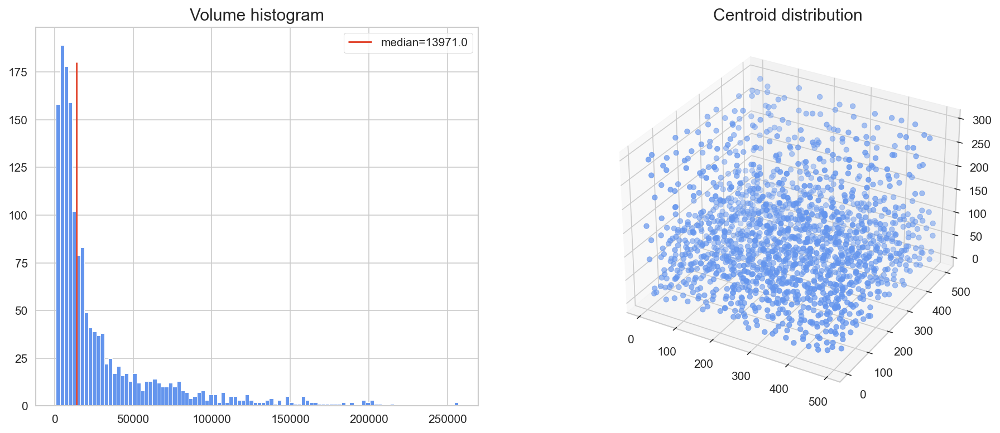

In [83]:
from mpl_toolkits.mplot3d.axes3d import Axes3D
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(1, 2, 1)
grains['area'].hist(bins=100,ax=ax, color='cornflowerblue'); ax.set_title('Volume histogram')
md=grains['area'].median();
ax.vlines([md],ymin=0,ymax=180,label='median={}'.format(md));
ax.legend()
ax3d = fig.add_subplot(1, 2, 2, projection='3d')
ax3d.scatter(grains['centroid-0'],grains['centroid-1'],grains['centroid-2'], color='cornflowerblue');
ax3d.set_title('Centroid distribution');

### A pair plot of the properties

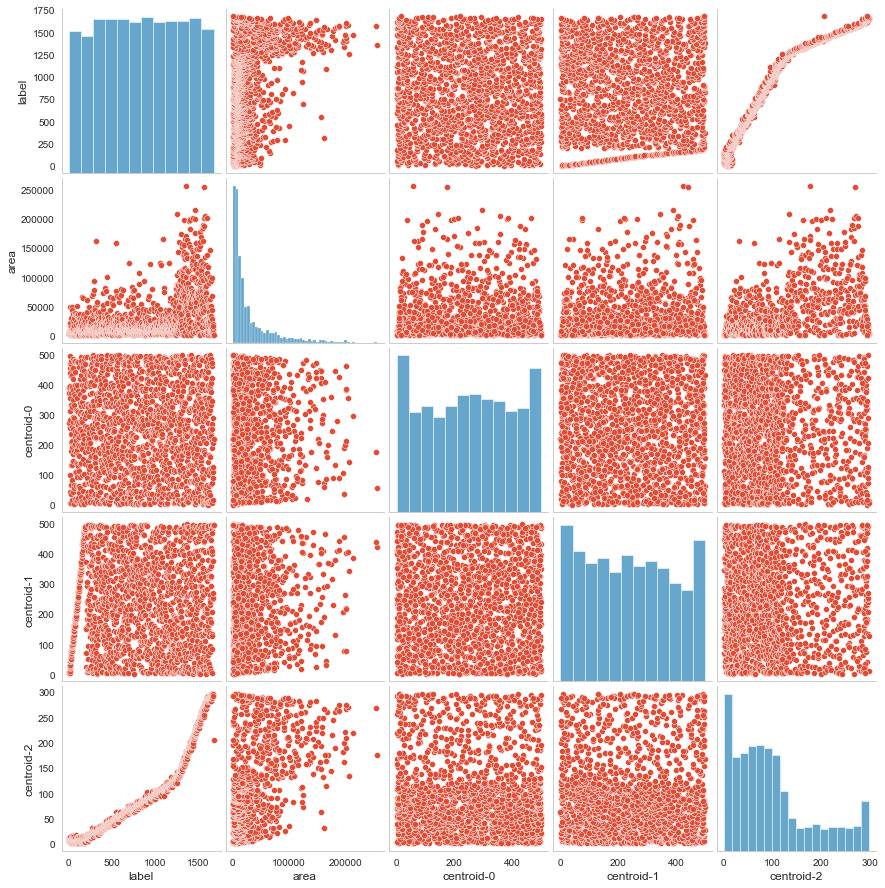

In [178]:
sns.pairplot(grains, vars=['label','area','centroid-0','centroid-1','centroid-2']);

We can see clear property pairs that provide information to support the classification:
- The item label vs area or centroid-2. 
- The item area vs centroid-2

### A closer look at the relevant pairs

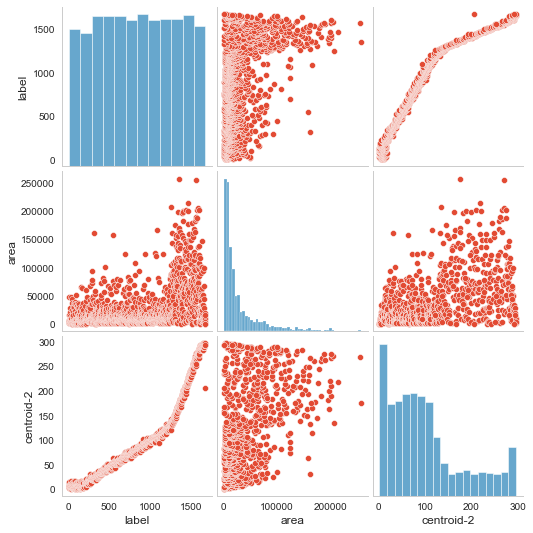

In [179]:
sns.pairplot(grains, vars=['label','area','centroid-2']);

We see here that there is a clear connection between the label and area and centroid. This does normally not hold true, but is rather a coincidence because of the way the labelling algorithm is implemented. It increases the label numbers with the linear scan over the coordinates. Still, in our case we can used this to our advantage as it clearly helps us to find the cut line between the two groups. 

### Looking for clusters

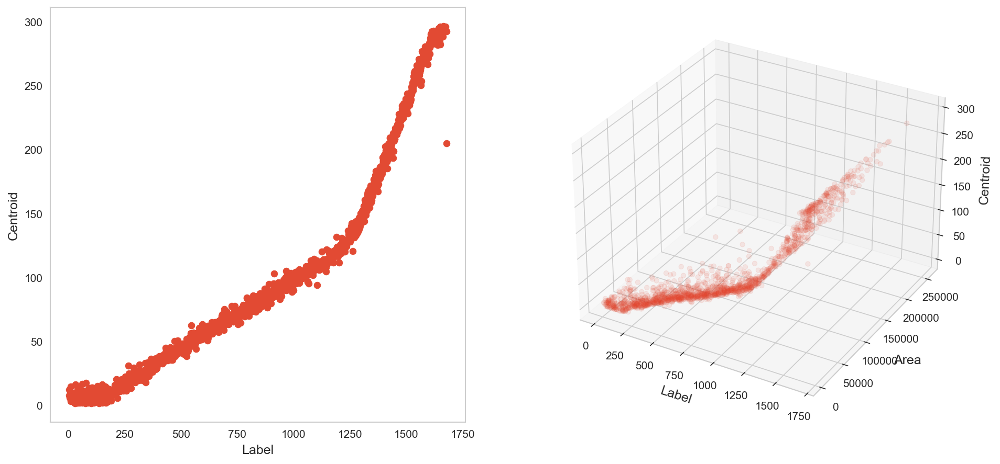

In [84]:
fig = plt.figure(figsize=(15,7))
axlc = fig.add_subplot(1,2,1)
axlc.scatter(grains['label'], grains['centroid-2'])
axlc.set_ylabel('Centroid'); axlc.set_xlabel('Label')
ax3d = fig.add_subplot(1, 2, 2, projection='3d')
ax3d.scatter(grains['label'], grains['area'], grains['centroid-2'], alpha=0.1);
ax3d.set_xlabel('Label'); ax3d.set_ylabel('Area');  ax3d.set_zlabel('Centroid'); 

These are logical pairings - the grains fractions are
- packed in the vertical direction
- the watershed labels run in the vertical direction.

### K-Means to cluster the grains

In [90]:
from sklearn.cluster import KMeans

kmeans= KMeans(2)
x=kmeans.fit_predict(grains[['label','area','centroid-2']].values)
grains['group']=x.tolist()
grains.sample(5,random_state=30)

,label,area,centroid-0,centroid-1,centroid-2,fg,small,group
852,853,6719,255.218634,494.421789,84.453788,True,False,0
444,445,100690,435.006982,60.617301,36.261237,True,False,1
538,539,4143,120.373401,395.345643,53.542119,True,False,0
1340,1341,155857,447.615680,232.692969,162.332625,True,False,1
1605,1606,27592,108.840533,205.322014,287.128298,True,False,0


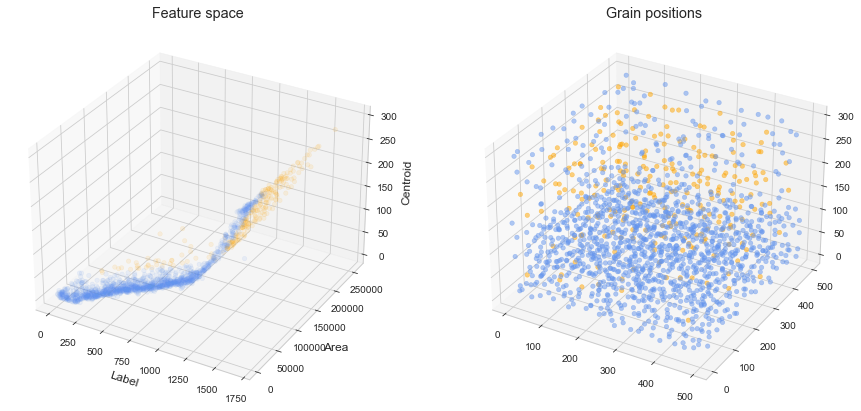

In [370]:
# Plotting
fig = plt.figure(figsize=(15,7))
ax3d = fig.add_subplot(1, 2, 1, projection='3d')
axpos = fig.add_subplot(1, 2, 2, projection='3d')
c = ['cornflowerblue','orange', 'red']
for idx in range(3) :
    group = grains[grains['group']==idx]
    ax3d.scatter(group['label'], group['area'], group['centroid-2'], alpha=0.1, color=c[idx]);
    axpos.scatter(group['centroid-0'], group['centroid-1'], group['centroid-2'], alpha=0.5, color=c[idx])
ax3d.set_title('Feature space'); axpos.set_title('Grain positions');
ax3d.set_xlabel('Label'); ax3d.set_ylabel('Area');  ax3d.set_zlabel('Centroid');

This is not really what we wanted!

Looking closer at the ranges of each feature we see that the Area more than 1000-fold greater.

__We need to scale the features__

### Try k-means to cluster the grains - normalized features

In [91]:
grains['nlabel'] = (grains['label']-grains['label'].mean())/grains['label'].std()
grains['narea']  = (grains['area']-grains['area'].mean())/grains['area'].std()
grains['nz']     = (grains['centroid-2']-grains['centroid-2'].mean())/grains['centroid-2'].std()

kmeans= KMeans(2)
x=kmeans.fit_predict(grains[['nlabel','narea','nz']].values)
grains['group']=x

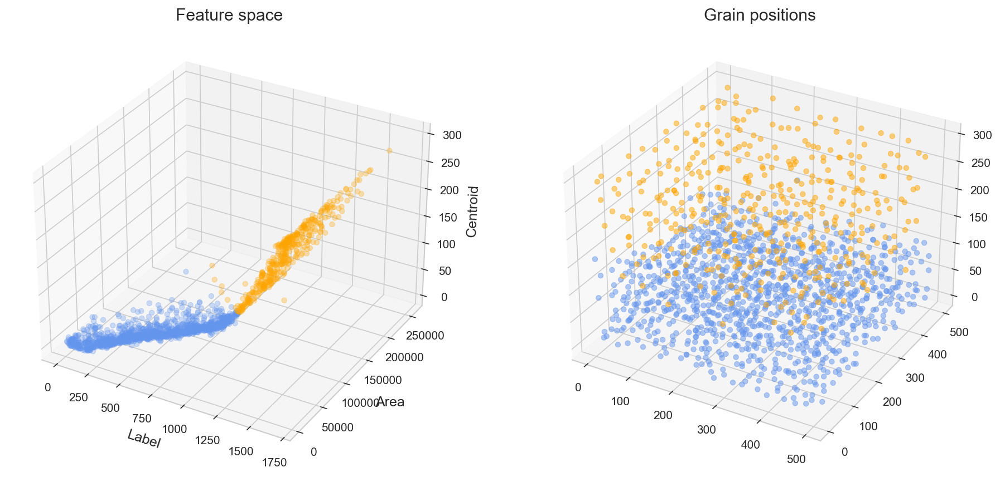

In [92]:
# Plotting
fig = plt.figure(figsize=(15,7))
ax3d = fig.add_subplot(1, 2, 1, projection='3d')
axpos = fig.add_subplot(1, 2, 2, projection='3d')
c = ['cornflowerblue','orange', 'red']
for idx in range(3) :
    group = grains[grains['group']==idx]
    ax3d.scatter(group['label'], group['area'], group['centroid-2'], alpha=0.3, color=c[idx]);
    axpos.scatter(group['centroid-0'], group['centroid-1'], group['centroid-2'], alpha=0.5, color=c[idx])
ax3d.set_title('Feature space'); axpos.set_title('Grain positions');
ax3d.set_xlabel('Label'); ax3d.set_ylabel('Area');  ax3d.set_zlabel('Centroid');

### Looking at the grains size histograms 

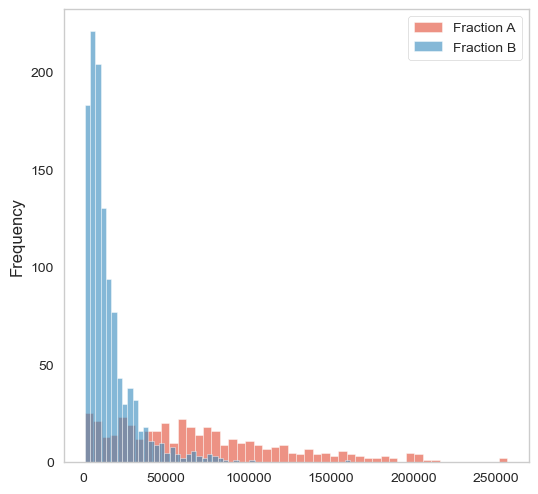

In [248]:
fig, ax =plt.subplots(1,1,figsize=(6,6), dpi=100)

grains[grains['group']==0]['area'].plot.hist(ax=ax, bins=50, label='Fraction A',alpha=0.6)
grains[grains['group']==1]['area'].plot.hist(ax=ax, bins=50, label='Fraction B',alpha=0.6)
ax.legend();

### Assign classes back to the image
Finally, we come to the last step assigning group labels to the grains.

In [94]:
import skimage.morphology.greyreconstruct as gr

def assignGroups(img, itemdf) :
    seeds = np.zeros_like(bi).astype('float')
    for i,row in itemdf.iterrows() :
        seeds[int(np.floor(row['centroid-0'])), int(np.floor(row['centroid-1'])), int(np.floor(row['centroid-2']))]=2+row['group']

    a=img*seeds.max()+1.0
    seeds[a<seeds] = 0
    glbl = gr.reconstruction(seeds,a,method='dilation')-1
    
    return glbl

You could also use the ```skimage.segmentation.flood_fill``` instead of the reconstruction algorithm. That woudl require you to implement a loop over the seed values.

### Apply the label assignment to the grains

In [98]:
glbl = assignGroups(bi,grains);

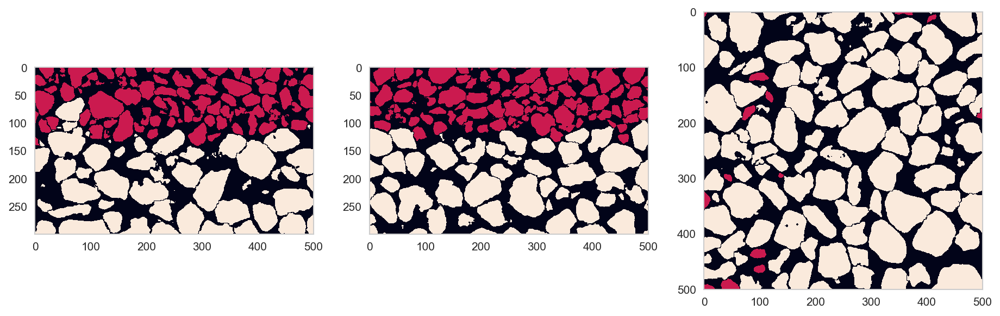

In [99]:
fig,ax= plt.subplots(1,3,figsize=(15,5))
ax[0].imshow(glbl[250,:,:].transpose(), interpolation='none')
ax[1].imshow(glbl[:,250,:].transpose(), interpolation='none')
ax[2].imshow(glbl[:,:,150], interpolation='none');

### The interface surface

(0.0, 160.0)

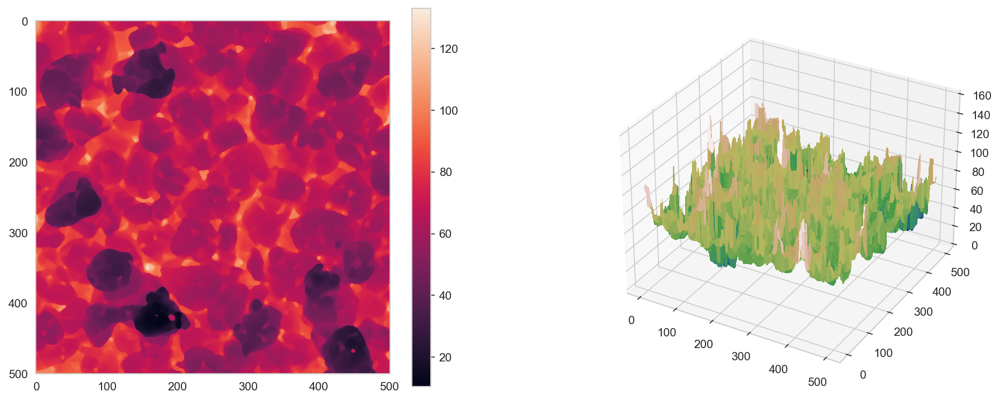

In [133]:
import skimage.filters as flt
topA    = np.argmax(glbl==1,axis=2)
bottomB = np.argmax(glbl==2,axis=2)
mAB = flt.median(0.5*(topA+bottomB),selem=np.ones([7,7]))

fig= plt.figure(figsize=(15,6))
ax0 = plt.subplot(1,2,1)
im=ax0.imshow(mAB); 
fig.colorbar(im,ax=ax0);
ax1 = plt.subplot(1,2,2,projection='3d')
xx,yy = np.meshgrid(np.arange(501),np.arange(501))
ax1.plot_surface(xx,yy,mAB,cmap='gist_earth',linewidth=0, antialiased=False);
ax1.set_zlim(0, 160)

# Battery Example

We use an example from the Laboratory for Nanoelectronics at ETH Zurich. The datasets are x-ray tomography images of the battery micro- and nanostructures. As the papers below document, a substantial amount of image processing is required to extract meaningful physical and chemical values from these images.

## Acknowledgements
The relevant publications which also contain links to the full collection of datasets.

- [X‐Ray Tomography of Porous, Transition Metal Oxide Based Lithium Ion Battery Electrodes](https://doi.org/10.1002/aenm.201200932)

- [Quantifying Inhomogeneity of Lithium Ion Battery Electrodes and Its Influence on Electrochemical Performance](https://doi.org/10.1149/2.0311802jes)

## Goal
The goal is to 
- Segment and quantify the relevant structures 
- Find out what changes occur between 0 and 2000 bar of pressure. 

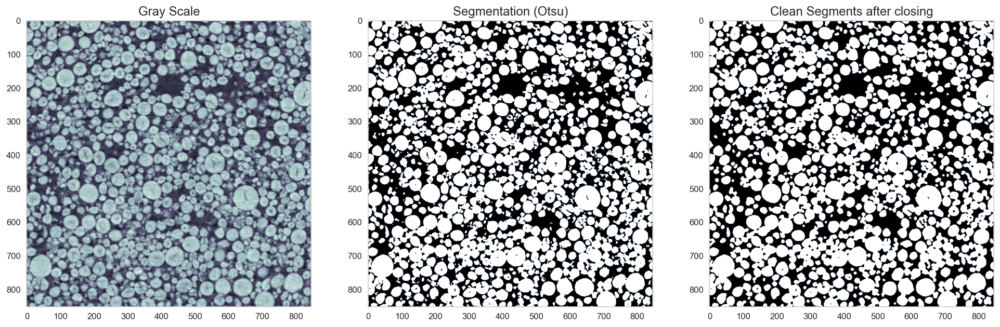

In [41]:
from scipy.ndimage import binary_fill_holes
from skimage.morphology import opening, closing, disk
from skimage.filters import threshold_otsu
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
%matplotlib inline
bw_img = imread("data/NMC_90wt_2000bar_115.tif")[:, :, 0]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10), dpi=120)
ax1.imshow(bw_img, cmap='bone'), ax1.set_title('Gray Scale')
thresh_img = bw_img > threshold_otsu(bw_img)
ax2.imshow(thresh_img, cmap='bone'), ax2.set_title('Segmentation (Otsu)')
bw_seg_img = closing(
    closing(
        opening(thresh_img, disk(3)),
        disk(1)
    ), disk(1)
)
ax3.imshow(bw_seg_img, cmap='bone'); ax3.set_title('Clean Segments after closing');

## Let the water flow...

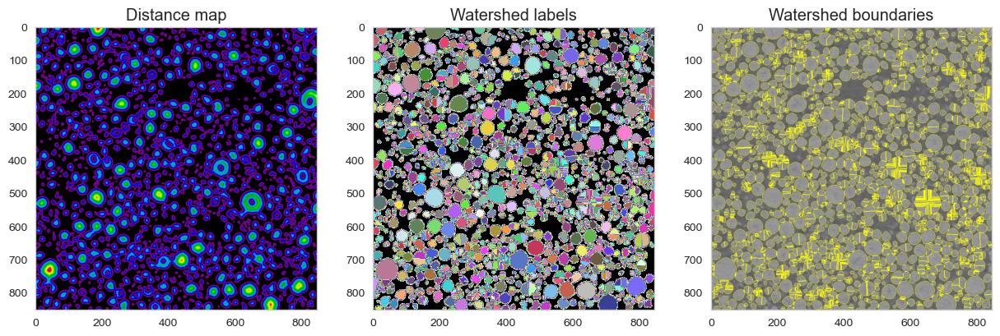

In [42]:
from scipy.ndimage import distance_transform_edt
from skimage.morphology import label
from skimage.feature import peak_local_max
from skimage.segmentation import mark_boundaries
from matplotlib import cm
from matplotlib.colors import ListedColormap
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,  8), dpi=100)

bw_dmap = distance_transform_edt(bw_seg_img)

ax1.imshow(bw_dmap, cmap='nipy_spectral'), ax1.set_title('Distance map')

bw_peaks = label(peak_local_max(bw_dmap, indices=False, footprint=np.ones((3, 3)),
                                labels=bw_seg_img, exclude_border=True))

ws_labels = watershed(-bw_dmap, bw_peaks, mask=bw_seg_img)
clist=np.random.uniform(low=0.2,size=[ws_labels.max(),3]); clist[0,:]=0;
wildmap = ListedColormap(clist)
ax2.imshow(ws_labels, cmap=wildmap), ax2.set_title('Watershed labels')
# find boundaries
ax3.imshow(mark_boundaries(label_img=ws_labels, image=bw_img)); ax3.set_title('Watershed boundaries');

## Too much detail...

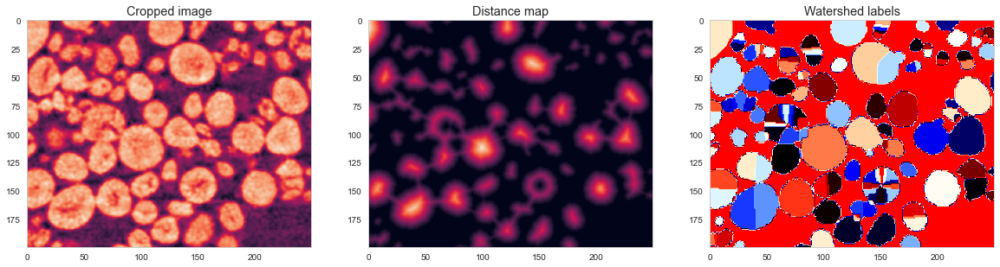

In [43]:
def get_roi(x): return x[0:200, 200:450]

im_crop = get_roi(bw_img)
dist_map = get_roi(bw_dmap)
node_id_image = get_roi(ws_labels)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 8))
ax1.imshow(im_crop), ax1.set_title('Cropped image')
ax2.imshow(dist_map), ax2.set_title('Distance map')
#ax3.imshow(node_id_image,cmap='gist_earth'), ax3.set_title('Watershed labels');
ax3.imshow(node_id_image,cmap='flag'), ax3.set_title('Watershed labels');

## Representing as a Graph
Here we can change the representation from a number of random labels to a graph

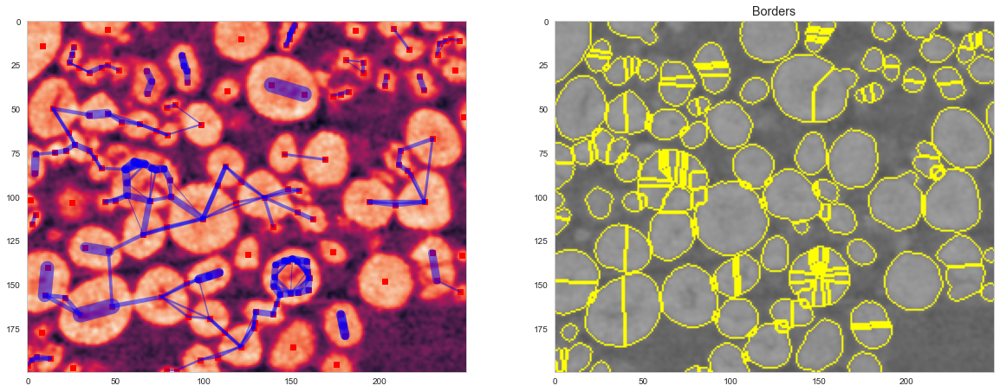

In [44]:
from skimage.morphology import dilation
from skimage.measure import perimeter
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

ax1.imshow(im_crop)

node_dict = {}
for c_node in np.unique(node_id_image[node_id_image > 0]):
    y_n, x_n = np.where(node_id_image == c_node)
    node_dict[c_node] = {'x': np.mean(x_n),
                         'y': np.mean(y_n),
                         'width': np.mean(dist_map[node_id_image == c_node]),
                         'perimeter': perimeter(node_id_image == c_node)}
    ax1.plot(np.mean(x_n), np.mean(y_n), 'rs')

edge_dict = {}

for i in node_dict.keys():
    i_grow = dilation(node_id_image == i, np.ones((3, 3)))
    for j in node_dict.keys():
        if i < j:
            j_grow = dilation(node_id_image == j, np.ones((3, 3)))
            interface_length = np.sum(i_grow & j_grow)
            if interface_length > 0:
                v_nodes = [i, j]

                edge_dict[(i, j)] = {'start': v_nodes[0],
                                     'start_perimeter': node_dict[v_nodes[0]]['perimeter'],
                                     'end_perimeter': node_dict[v_nodes[-1]]['perimeter'],
                                     'end': v_nodes[-1],
                                     'interface_length': interface_length,
                                     'euclidean_distance': np.sqrt(np.square(node_dict[v_nodes[0]]['x'] -
                                                                             node_dict[v_nodes[-1]]['x']) +
                                                                   np.square(node_dict[v_nodes[0]]['y'] -
                                                                             node_dict[v_nodes[-1]]['y'])
                                                                   ),
                                     'max_width': np.max(dist_map[i_grow & j_grow]),
                                     'mean_width': np.mean(dist_map[i_grow & j_grow])}
                s_node = node_dict[v_nodes[0]]
                e_node = node_dict[v_nodes[-1]]
                ax1.plot([s_node['x'], e_node['x']],
                         [s_node['y'], e_node['y']], 'b-',
                         linewidth=np.max(dist_map[i_grow & j_grow]), alpha=0.5)

ax2.imshow(mark_boundaries(label_img=node_id_image, image=im_crop))
ax2.set_title('Borders');

In [45]:
import pandas as pd
edge_df = pd.DataFrame(list(edge_dict.values()))
edge_df.head(5)

,start,start_perimeter,end_perimeter,end,interface_length,euclidean_distance,max_width,mean_width
0,6,31.656854,25.621320,10,32,3.517456,6.403124,3.191413
1,6,31.656854,27.656854,18,1,6.265257,6.324555,6.324555
2,10,25.621320,27.656854,18,30,2.748111,6.324555,3.217437
3,18,27.656854,19.621320,27,28,2.612361,5.656854,2.666442
4,18,27.656854,25.313708,33,1,6.368174,5.000000,5.000000


## Combine split electrodes
Here we combine split electrodes by using a cutoff on the ratio of the interface length to the start and end perimeters

In [46]:
delete_edges = edge_df.query(
    'interface_length>0.33*(start_perimeter+end_perimeter)')
print('Found', delete_edges.shape[0], '/', edge_df.shape[0], 'edges to delete')
delete_edges.head(5)

Found 77 / 203 edges to delete


,start,start_perimeter,end_perimeter,end,interface_length,euclidean_distance,max_width,mean_width
0,6,31.656854,25.621320,10,32,3.517456,6.403124,3.191413
2,10,25.621320,27.656854,18,30,2.748111,6.324555,3.217437
3,18,27.656854,19.621320,27,28,2.612361,5.656854,2.666442
6,27,19.621320,25.313708,33,24,3.874383,5.000000,2.409123
7,28,12.414214,28.727922,29,16,5.028904,3.000000,1.404919


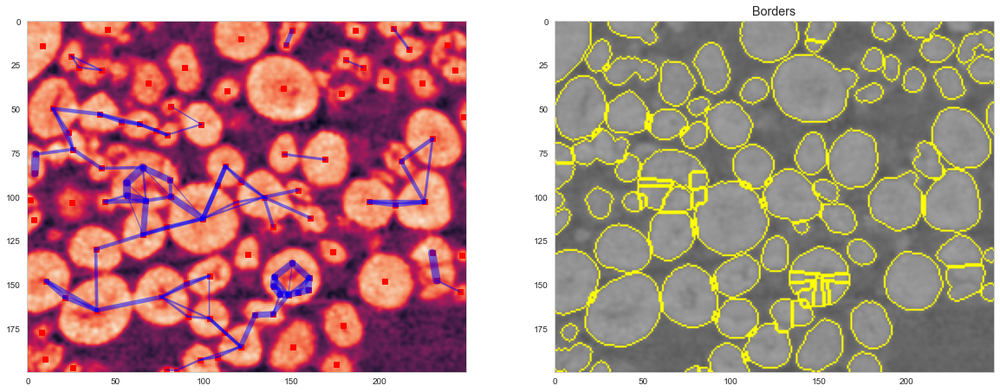

In [47]:
node_id_image = get_roi(ws_labels)
for _ in range(3):
    # since some mappings might be multistep
    for _, c_row in delete_edges.iterrows():
        node_id_image[node_id_image == c_row['end']] = c_row['start']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

ax1.imshow(im_crop)

node_dict = {}
for c_node in np.unique(node_id_image[node_id_image > 0]):
    y_n, x_n = np.where(node_id_image == c_node)
    node_dict[c_node] = {'x': np.mean(x_n),
                         'y': np.mean(y_n),
                         'width': np.mean(dist_map[node_id_image == c_node]),
                         'perimeter': perimeter(node_id_image == c_node)}
    ax1.plot(np.mean(x_n), np.mean(y_n), 'rs')

edge_dict = {}

for i in node_dict.keys():
    i_grow = dilation(node_id_image == i, np.ones((3, 3)))
    for j in node_dict.keys():
        if i < j:
            j_grow = dilation(node_id_image == j, np.ones((3, 3)))
            interface_length = np.sum(i_grow & j_grow)
            if interface_length > 0:
                v_nodes = [i, j]

                edge_dict[(i, j)] = {'start': v_nodes[0],
                                     'start_perimeter': node_dict[v_nodes[0]]['perimeter'],
                                     'end_perimeter': node_dict[v_nodes[-1]]['perimeter'],
                                     'end': v_nodes[-1],
                                     'interface_length': interface_length,
                                     'euclidean_distance': np.sqrt(np.square(node_dict[v_nodes[0]]['x'] -
                                                                             node_dict[v_nodes[-1]]['x']) +
                                                                   np.square(node_dict[v_nodes[0]]['y'] -
                                                                             node_dict[v_nodes[-1]]['y'])
                                                                   ),
                                     'max_width': np.max(dist_map[i_grow & j_grow]),
                                     'mean_width': np.mean(dist_map[i_grow & j_grow])}
                s_node = node_dict[v_nodes[0]]
                e_node = node_dict[v_nodes[-1]]
                ax1.plot([s_node['x'], e_node['x']],
                         [s_node['y'], e_node['y']], 'b-',
                         linewidth=np.max(dist_map[i_grow & j_grow]), alpha=0.5)

ax2.imshow(mark_boundaries(label_img=node_id_image, image=im_crop))
ax2.set_title('Borders');

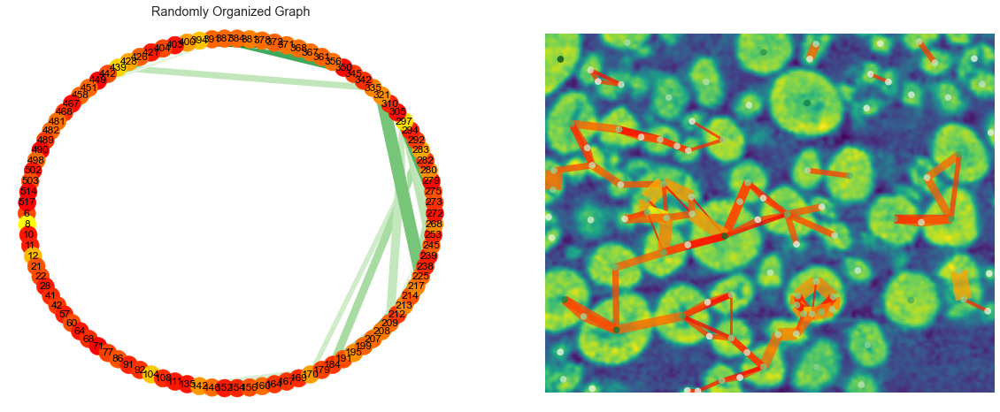

In [48]:
import networkx as nx
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
G = nx.Graph()
for k, v in node_dict.items():
    G.add_node(k, weight=v['width'])
for k, v in edge_dict.items():
    G.add_edge(v['start'], v['end'], **v)
nx.draw_shell(G, ax=ax1, with_labels=True,
              node_color=[node_dict[k]['width']
                          for k in sorted(node_dict.keys())],
              node_size=400,
              cmap=plt.cm.autumn,
              edge_color=[G.edges[k]['interface_length']
                          for k in list(G.edges.keys())],
              width=[2*G.edges[k]['max_width'] for k in list(G.edges.keys())],
              edge_cmap=plt.cm.Greens)
ax1.set_title('Randomly Organized Graph')
ax2.imshow(im_crop, cmap="viridis")
nx.draw(G,
        pos={k: (v['x'], v['y']) for k, v in node_dict.items()},
        ax=ax2,
        node_color=[node_dict[k]['width'] for k in sorted(node_dict.keys())],
        node_size=50,
        cmap=plt.cm.Greens,
        edge_color=[G.edges[k]['interface_length']
                    for k in list(G.edges.keys())],
        width=[2*G.edges[k]['max_width'] for k in list(G.edges.keys())],
        edge_cmap=plt.cm.autumn,
        alpha=0.75,
        with_labels=False)

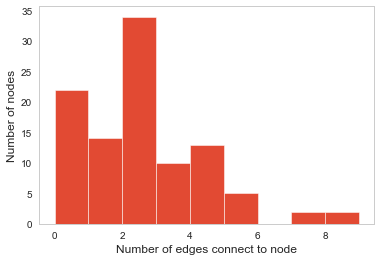

In [49]:
degree_sequence = sorted([d for n, d in G.degree()],
                         reverse=True)  # degree sequence
plt.hist(degree_sequence, bins=np.arange(10)), plt.xlabel('Number of edges connect to node'), plt.ylabel('Number of nodes');

# Summary

## Skeletons
- Minimal structure of an object
- Object topology is preserved

## Watershed segmentation
- Labels touching item
- May oversegment
- Frequently used algorithm